In [1]:
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from pmdarima import auto_arima
from statsmodels.tsa.arima_model import ARMA,ARMAResults,ARIMA,ARIMAResults
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.statespace.tools import diff
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tools.eval_measures import rmse, meanabs
from sklearn.metrics import mean_squared_error,mean_absolute_error
import itertools 
import pmdarima as pm
# To avoid warning from statsmodels
import warnings
warnings.filterwarnings('ignore') # ignores only the little red warning

In [2]:
actual_migration = pd.read_csv("C://Users//divakar//TSA//TSA/refugeedata_ex.csv", index_col='Date')
migration = actual_migration.iloc[:340]
#migration = pd.read_csv("C://Users//divakar//TSA//TSA/refugeedata_ex.csv", index_col='Date')
migration.index = pd.to_datetime(migration.index, format='%d-%m-%Y')
migration.index.freq='D'

# Removing the commas and converting the values to Numeric
migration = migration.replace(',','',regex=True)
migration = migration.apply(pd.to_numeric)

In [3]:
migration.head()

,Arrivals to Italy,Arrivals to Greek Islands,Departures to mainland Greece,Arrivals to fYRoM,Arrivals to Serbia,Arrivals to Croatia,Arrivals to Hungary,Arrivals to Slovenia,Arrivals to Austria,EU Turkey Cut-Off Deal
Date,,,,,,,,,,
2015-10-01,343,2631,2409,4370,5900.0,4344,3667.0,0.0,4550,0
2015-10-02,0,4055,1215,5853,3700.0,5546,4897.0,0.0,2700,0
2015-10-03,128,6097,4480,4202,3700.0,6086,6056.0,NaN,7100,0
2015-10-04,62,4763,1513,5181,4250.0,5065,5925.0,0.0,5800,0
2015-10-05,0,5909,7833,4282,3250.0,6338,5952.0,0.0,6100,0


In [4]:
# Checking for missing values and if present, handling the same.
print(migration.isnull().sum())

# using interpolate method to fill in the missing values. (Avoid using dropna, as it leads to loss of data.)
migration.interpolate(inplace=True)
print()
print('After handling missing data')
print()
print(migration.isnull().sum())

Arrivals to Italy                0
Arrivals to Greek Islands        0
Departures to mainland Greece    0
Arrivals to fYRoM                0
Arrivals to Serbia               1
Arrivals to Croatia              0
Arrivals to Hungary              1
Arrivals to Slovenia             4
Arrivals to Austria              0
EU Turkey Cut-Off Deal           0
dtype: int64

After handling missing data

Arrivals to Italy                0
Arrivals to Greek Islands        0
Departures to mainland Greece    0
Arrivals to fYRoM                0
Arrivals to Serbia               0
Arrivals to Croatia              0
Arrivals to Hungary              0
Arrivals to Slovenia             0
Arrivals to Austria              0
EU Turkey Cut-Off Deal           0
dtype: int64


In [5]:
# Entering country name
countries = ['Arrivals to Italy', 'Arrivals to Greek Islands',
       'Departures to mainland Greece', 'Arrivals to fYRoM',
       'Arrivals to Serbia', 'Arrivals to Croatia', 'Arrivals to Hungary',
       'Arrivals to Slovenia', 'Arrivals to Austria']

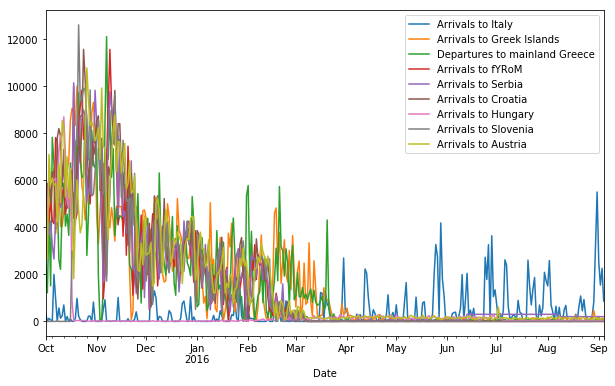

In [6]:
migration[countries].plot(figsize=(10,6))

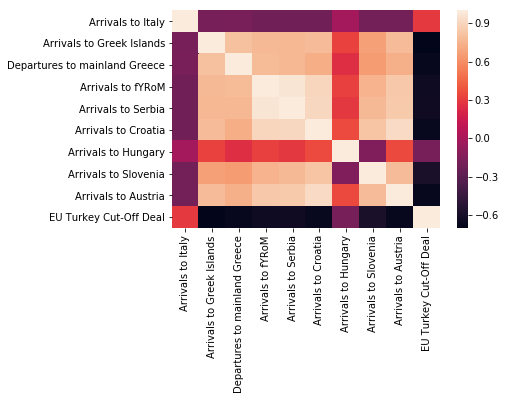

In [7]:
# Plotting the time series.
#migration.plot(figsize=(12,8));
import seaborn as sns
corr = migration.corr()
sns.heatmap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values)

In [8]:

corr = migration.corr()
corr.style.background_gradient(cmap='coolwarm')

,Arrivals to Italy,Arrivals to Greek Islands,Departures to mainland Greece,Arrivals to fYRoM,Arrivals to Serbia,Arrivals to Croatia,Arrivals to Hungary,Arrivals to Slovenia,Arrivals to Austria,EU Turkey Cut-Off Deal
Arrivals to Italy,1,-0.184672,-0.177052,-0.204146,-0.203442,-0.206663,-0.0156655,-0.1982,-0.203001,0.301779
Arrivals to Greek Islands,-0.184672,1,0.812917,0.7764,0.773342,0.789353,0.329746,0.672345,0.793422,-0.701848
Departures to mainland Greece,-0.177052,0.812917,1,0.784777,0.768356,0.729958,0.254896,0.654462,0.73409,-0.67258
Arrivals to fYRoM,-0.204146,0.7764,0.784777,1,0.968621,0.90045,0.320068,0.751224,0.842264,-0.639864
Arrivals to Serbia,-0.203442,0.773342,0.768356,0.968621,1,0.911951,0.290564,0.776578,0.84751,-0.631079
Arrivals to Croatia,-0.206663,0.789353,0.729958,0.90045,0.911951,1,0.360792,0.821709,0.921545,-0.664459
Arrivals to Hungary,-0.0156655,0.329746,0.254896,0.320068,0.290564,0.360792,1,-0.153431,0.354255,-0.189243
Arrivals to Slovenia,-0.1982,0.672345,0.654462,0.751224,0.776578,0.821709,-0.153431,1,0.788722,-0.583242
Arrivals to Austria,-0.203001,0.793422,0.73409,0.842264,0.84751,0.921545,0.354255,0.788722,1,-0.672894
EU Turkey Cut-Off Deal,0.301779,-0.701848,-0.67258,-0.639864,-0.631079,-0.664459,-0.189243,-0.583242,-0.672894,1


In [9]:
# Checking Stationarity
for country in countries:
    print(f'Stationrity for {country} ',adfuller(migration[country])[1]<=0.05)

Stationrity for Arrivals to Italy  True
Stationrity for Arrivals to Greek Islands  False
Stationrity for Departures to mainland Greece  False
Stationrity for Arrivals to fYRoM  False
Stationrity for Arrivals to Serbia  False
Stationrity for Arrivals to Croatia  False
Stationrity for Arrivals to Hungary  True
Stationrity for Arrivals to Slovenia  False
Stationrity for Arrivals to Austria  False


Arrivals to Italy


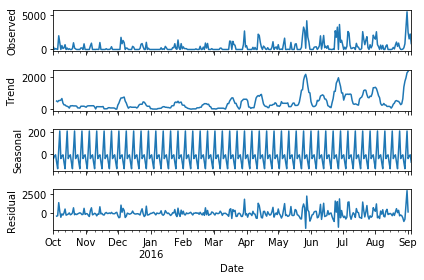

Arrivals to Greek Islands


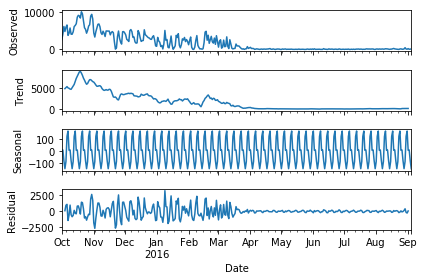

Departures to mainland Greece


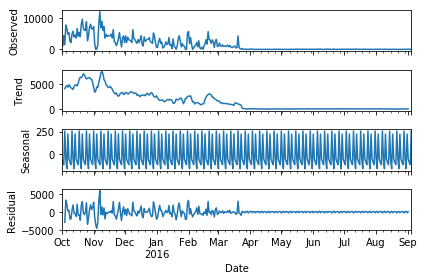

Arrivals to fYRoM


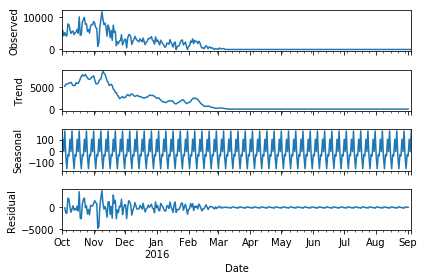

Arrivals to Serbia


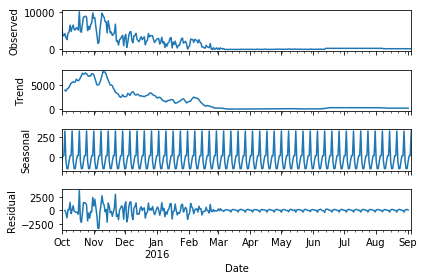

Arrivals to Croatia


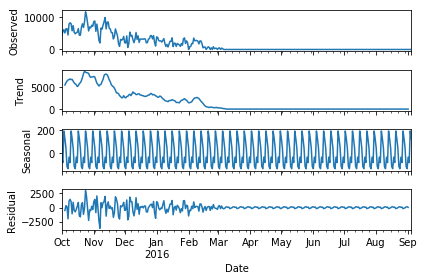

Arrivals to Hungary


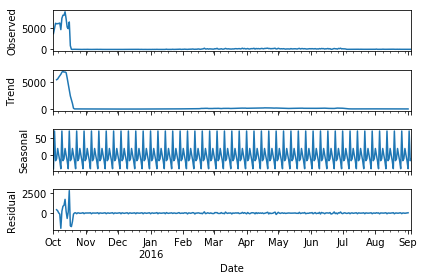

Arrivals to Slovenia


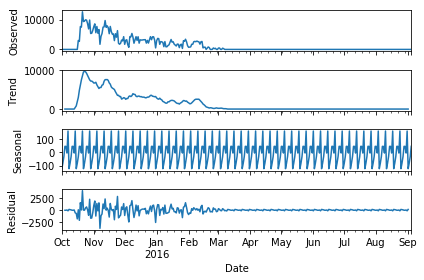

Arrivals to Austria


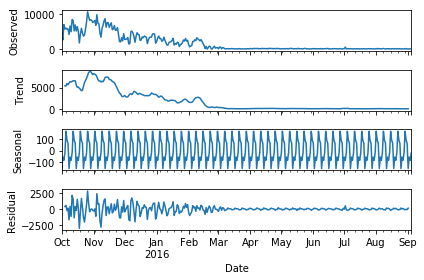

In [10]:
import statsmodels.api as sm
for country in countries:
    print(country)
    decomposed_migration = sm.tsa.seasonal_decompose(migration[country])
    figure = decomposed_migration.plot()
    plt.show()

Arrivals to Italy


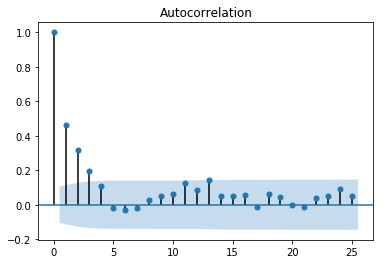

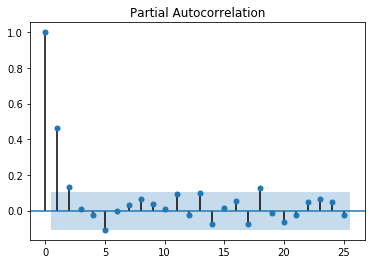

Arrivals to Greek Islands


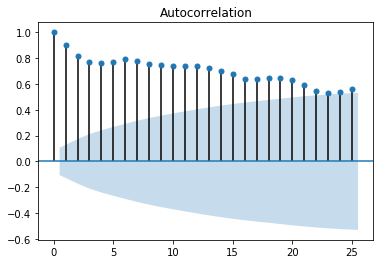

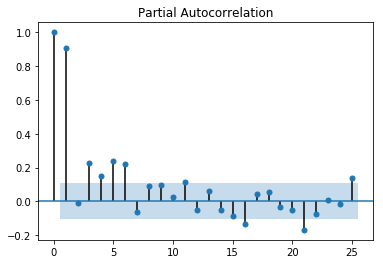

Departures to mainland Greece


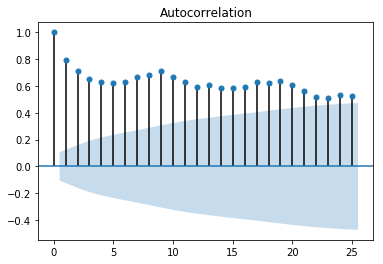

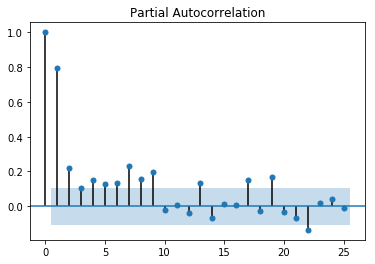

Arrivals to fYRoM


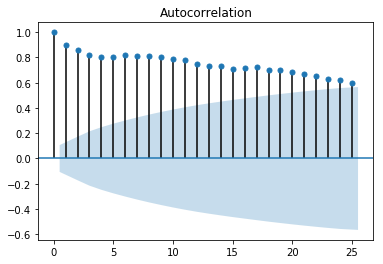

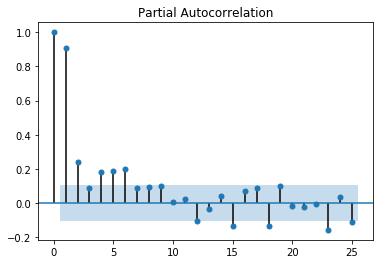

Arrivals to Serbia


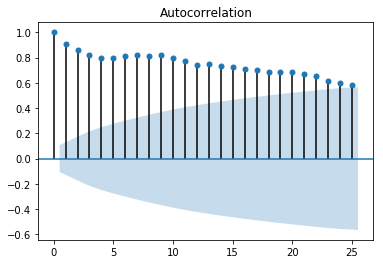

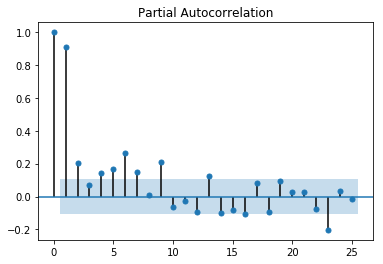

Arrivals to Croatia


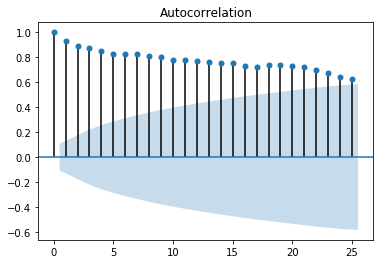

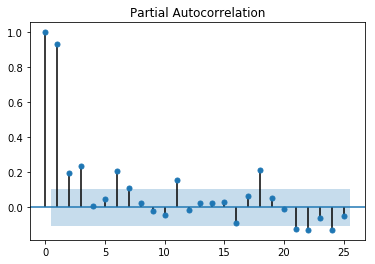

Arrivals to Hungary


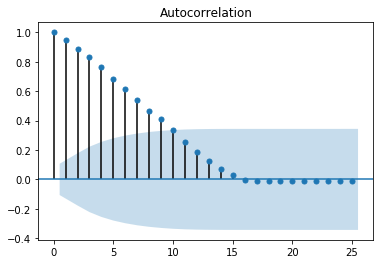

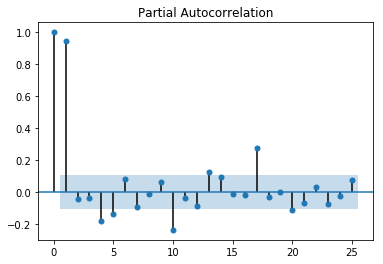

Arrivals to Slovenia


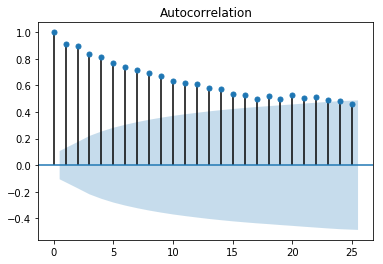

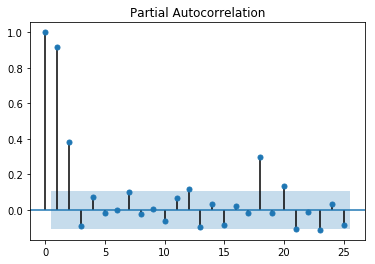

Arrivals to Austria


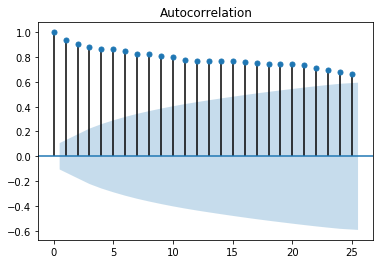

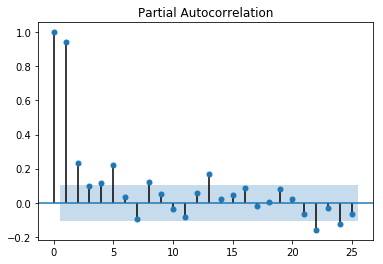

In [11]:
for country in countries:
    print(country)
    plot_acf(migration[country],lags=25)
    plot_pacf(migration[country],lags=25)
    plt.show()

# Sliding Window ARIMA

At iteration 1
130
100 30
Arrivals to Italy   (1, 0, 0)
Error Values
Mean Value : 196.63333333333333
MAE Value : 216.1515117018146
RMSE Value : 313.19837440428716
At iteration 2
160
130 30
Arrivals to Italy   (1, 0, 0)
Error Values
Mean Value : 115.33333333333333
MAE Value : 208.74655821759595
RMSE Value : 255.24667846344894
At iteration 3
190
160 30
Arrivals to Italy   (1, 0, 0)
Error Values
Mean Value : 320.3
MAE Value : 382.507321924493
RMSE Value : 606.260027785146
At iteration 4
220
190 30
Arrivals to Italy   (1, 0, 0)
Error Values
Mean Value : 416.2
MAE Value : 405.47719020724713
RMSE Value : 645.0246151000517
At iteration 5
250
220 30
Arrivals to Italy   (1, 0, 0)
Error Values
Mean Value : 649.4666666666667
MAE Value : 684.3076142351395
RMSE Value : 1157.15657349333
At iteration 6
280
250 30
Arrivals to Italy   (1, 1, 1)
Error Values
Mean Value : 844.0333333333333
MAE Value : 843.965135552264
RMSE Value : 1354.3342689075428
At iteration 7
310
280 30
Arrivals to Italy   (2, 1, 1)

Arrivals to Austria   (1, 1, 1)
Error Values
Mean Value : 158.93333333333334
MAE Value : 189.09978236102816
RMSE Value : 196.12313708545688
At iteration 6
280
250 30
Arrivals to Austria   (1, 1, 1)
Error Values
Mean Value : 157.53333333333333
MAE Value : 184.16632884663372
RMSE Value : 206.2904268548284
At iteration 7
310
280 30
Arrivals to Austria   (1, 1, 1)
Error Values
Mean Value : 130.66666666666666
MAE Value : 153.32619466952258
RMSE Value : 155.85643878126663
At iteration 8
340
310 30
Arrivals to Austria   (1, 1, 1)
Error Values
Mean Value : 128.7
MAE Value : 149.41875472042906
RMSE Value : 153.84631841622922


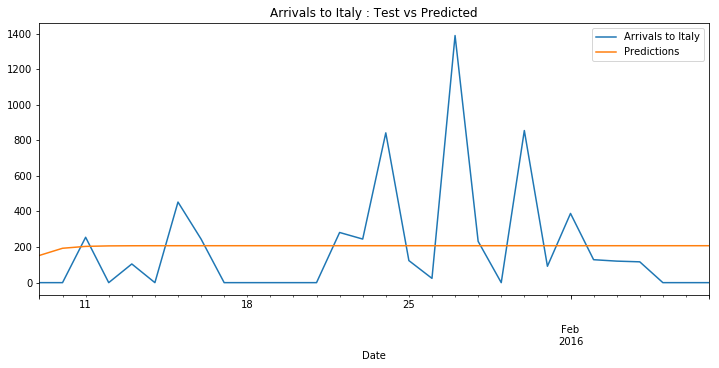

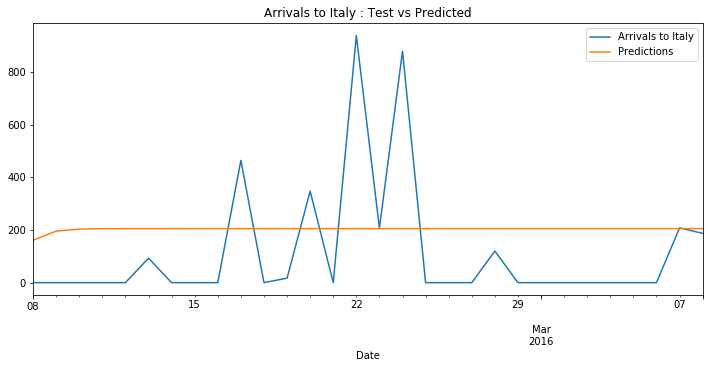

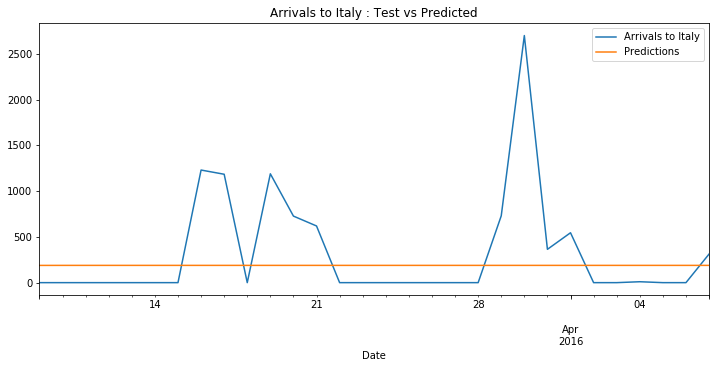

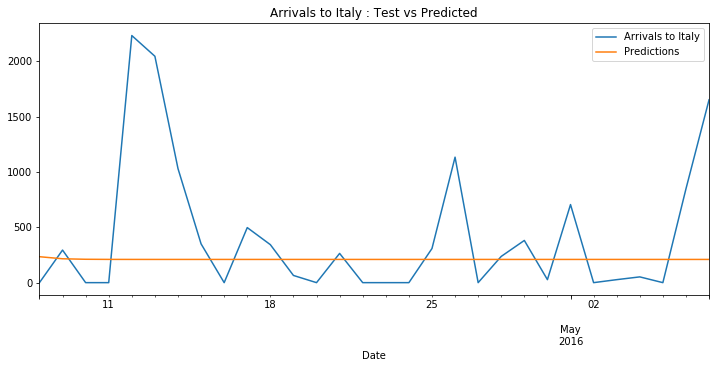

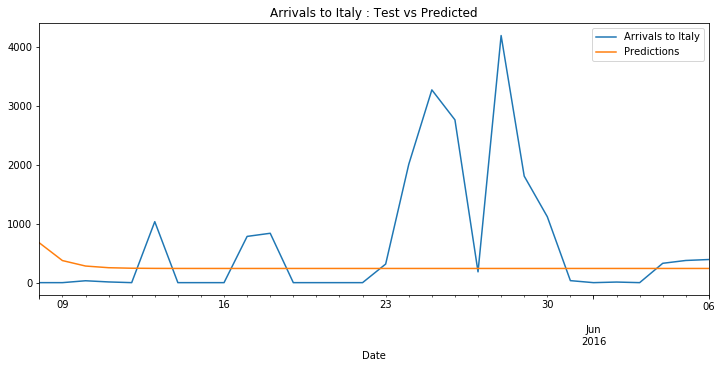

...

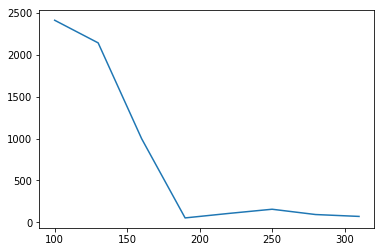

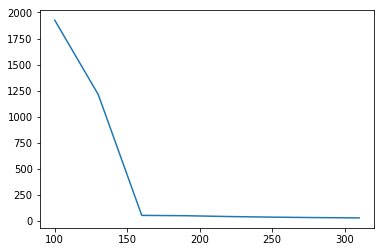

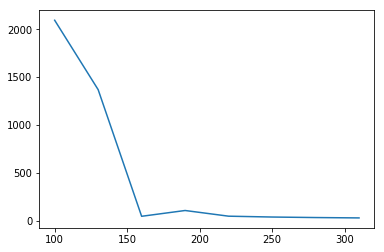

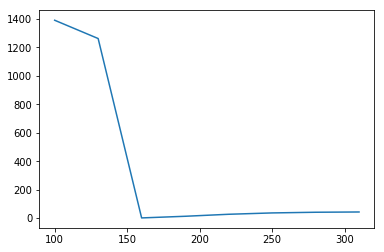

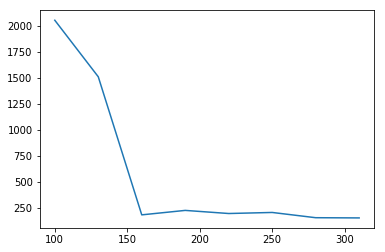

In [7]:
arima_performance=[]
countries_sliding = ['Arrivals to Italy', 'Arrivals to Greek Islands',
       'Departures to mainland Greece', 'Arrivals to fYRoM','Arrivals to Croatia',
       'Arrivals to Slovenia', 'Arrivals to Austria']
interval = [100,130,160,190,220,250,280,310]
for country in countries_sliding:
    i = 99
    count = 0
    while (i<len(migration)-1):
        count = count+1
        print ("At iteration {}".format(count))
        train = migration.iloc[0:i+1]
        test = migration.iloc[i+1:i+31]
        len_data = len(train)+len(test)
        print(len_data)
        print (len(train), len(test))

        model = pm.auto_arima(train[country],d=None, seasonal=False)
        print(country,' ',model.order)
        results = ARIMA(train[country], order=model.order).fit()

        start=len(train)
        end=len(train)+len(test)-1
        predictions = results.predict(start=start, end=end).rename('Predictions')

        plt.figure();
        plt.title(label=f'{country} : Test vs Predicted');
        test[country].plot(figsize=(12,5), legend=True);
        predictions.plot(legend=True);

        print('Error Values')
        print('Mean Value :', test[country].mean())
        print('MAE Value :', meanabs(test[country],predictions))
        print('RMSE Value :', np.sqrt(mean_squared_error(test[country],predictions)))

        # ------------------------------------------------------------

        rmse = np.sqrt(mean_squared_error(test[country],predictions))
        arima_performance.append(rmse)
        i+=len(test)
        

i = 0
while (i<len(arima_performance)-1):
    perf = arima_performance[i:i+8]
    plt.plot(interval,perf)
    plt.show();
    i = i+8

# Simple ARIMA Model

Arrivals to Italy   (1, 1, 2)
Error Values
Mean Value : 843.56
MAE Value : 846.0841960147154
RMSE Value : 1356.9646154243233
Arrivals to Greek Islands   (2, 1, 1)
Error Values
Mean Value : 100.18
MAE Value : 119.26183949101812
RMSE Value : 140.69350366245718
Departures to mainland Greece   (1, 1, 1)
Error Values
Mean Value : 38.12
MAE Value : 61.92156590011102
RMSE Value : 71.97665105563293
Arrivals to fYRoM   (1, 1, 1)
Error Values
Mean Value : 0.0
MAE Value : 22.004522483281892
RMSE Value : 24.787992606298154
Arrivals to Serbia   (5, 1, 3)
Error Values
Mean Value : 244.0
MAE Value : 260.6602472979341
RMSE Value : 265.71660483661657
Arrivals to Croatia   (1, 1, 1)
Error Values
Mean Value : 0.0
MAE Value : 24.26314533567341
RMSE Value : 27.17716849479495
Arrivals to Hungary   (0, 1, 0)
Error Values
Mean Value : 38.64
MAE Value : 51.16595155709342
RMSE Value : 52.26801123768563
Arrivals to Slovenia   (2, 1, 2)
Error Values
Mean Value : 0.0
MAE Value : 30.474049905743513
RMSE Value : 34.

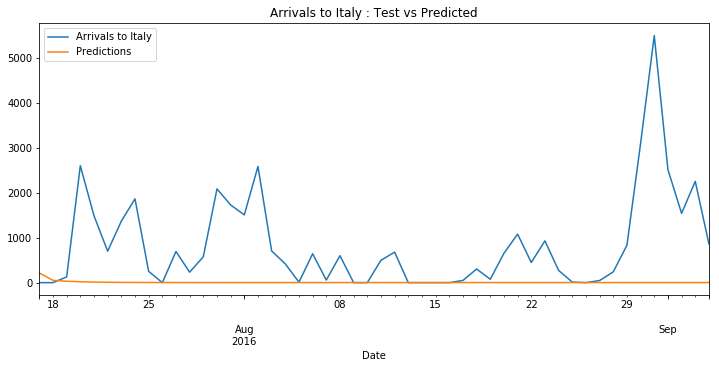

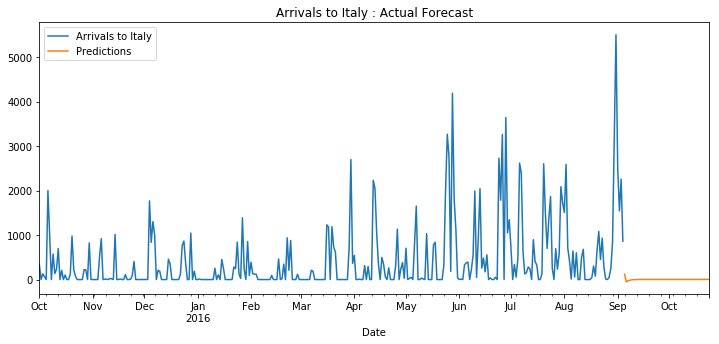

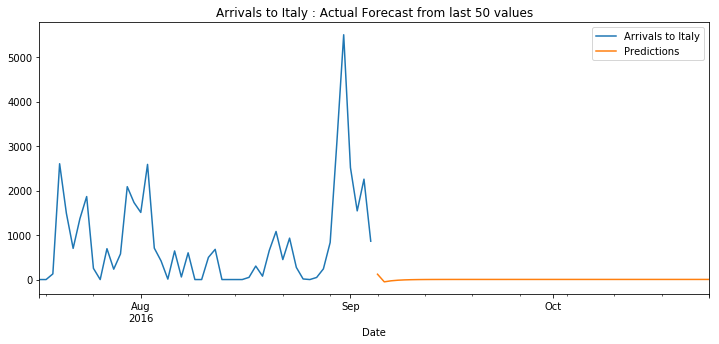

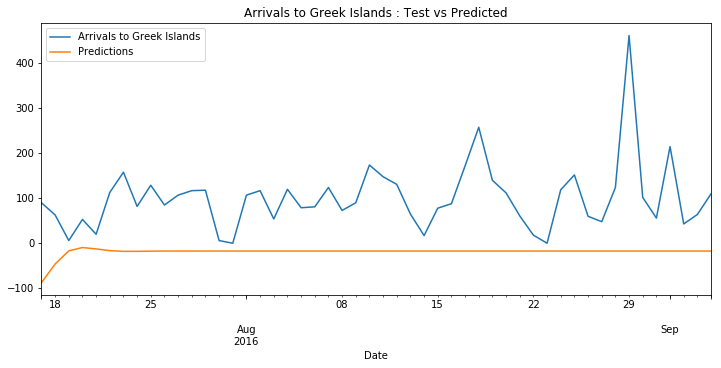

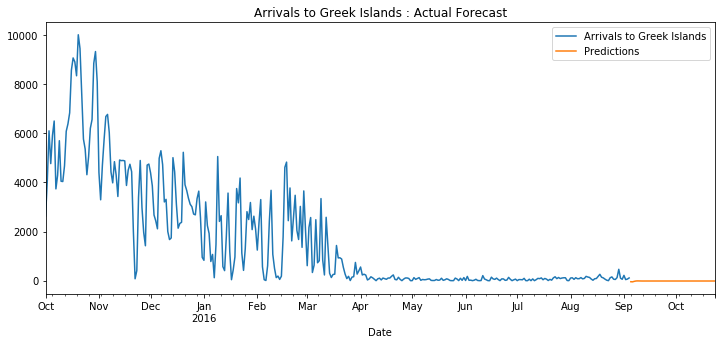

...

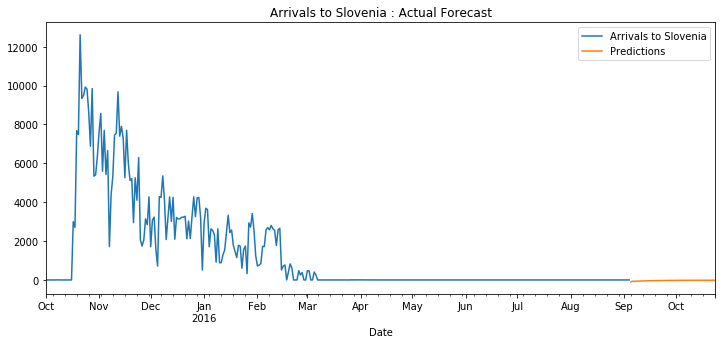

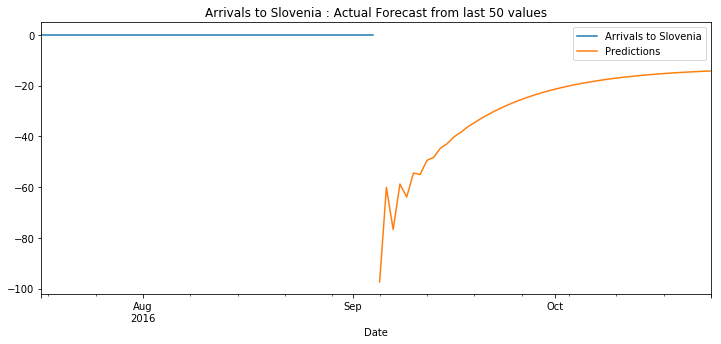

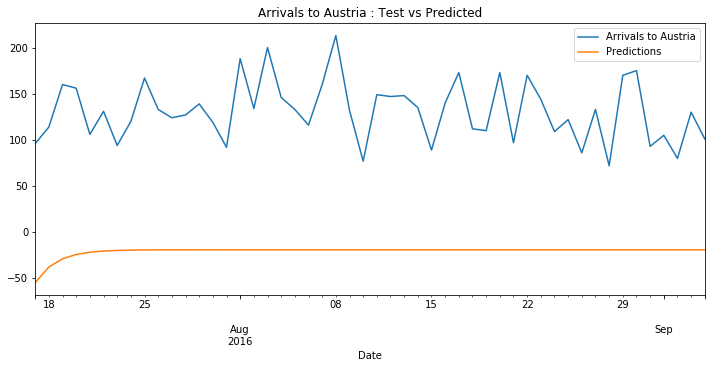

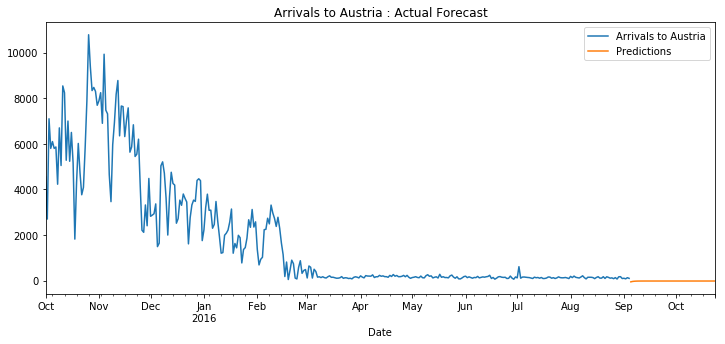

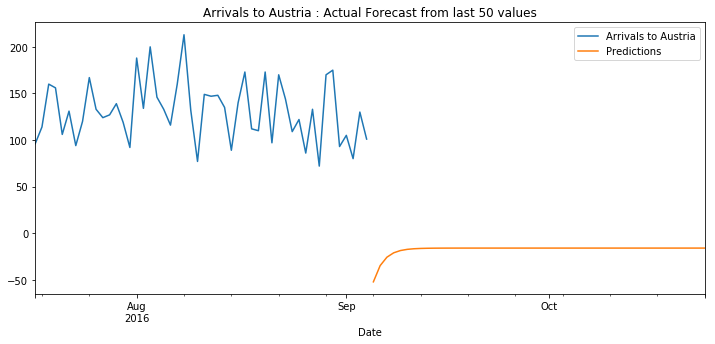

In [8]:
for country in countries:
    train = migration[country].iloc[:-50]
    test = migration[country].iloc[-50:]
    #print(len(train))
    #print(len(test))

    model = pm.auto_arima(migration[country],d=None, seasonal=False)
    print(country,' ',model.order)
    results = ARIMA(train, order=model.order).fit()

    start=len(train)
    end=len(train)+len(test)-1
    predictions = results.predict(start=start, end=end).rename('Predictions')

    plt.figure();
    plt.title(label=f'{country} : Test vs Predicted');
    test.plot(figsize=(12,5), legend=True);
    predictions.plot(legend=True);

    print('Error Values')
    print('Mean Value :', test.mean())
    print('MAE Value :', meanabs(test,predictions))
    print('RMSE Value :', np.sqrt(mean_squared_error(test,predictions)))

    # ------------------------------------------------------------

    # ACTUAL FORECAST

    results = ARIMA(migration[country], order=model.order).fit()

    start=len(migration[country])
    end=len(migration[country])+49
    predictions = results.predict(start=start, end=end).rename('Predictions')

    plt.figure();
    plt.title(label=f'{country} : Actual Forecast');
    migration[country].plot(figsize=(12,5), legend=True);
    predictions.plot(legend=True);

    plt.figure();
    plt.title(label=f'{country} : Actual Forecast from last 50 values');
    migration[country].iloc[-50:].plot(figsize=(12,5), legend=True);
    predictions.plot(legend=True);

# Simple SARIMAX model

Arrivals to Italy   (1, 0, 0) (0, 1, 1, 7)
Mean Value :  843.56
MAE Value : 734.8363025792299
RMSE Value : 1089.262012370632
Arrivals to Greek Islands   (2, 0, 2) (0, 1, 1, 7)
Mean Value :  100.18
MAE Value : 121.00545457692844
RMSE Value : 146.82644134734502
Departures to mainland Greece   (2, 0, 1) (1, 1, 1, 7)
Mean Value :  38.12
MAE Value : 251.94934323993093
RMSE Value : 290.0655038637811
Arrivals to fYRoM   (2, 0, 3) (0, 1, 1, 7)
Mean Value :  0.0
MAE Value : 320.97132192693493
RMSE Value : 346.6087184734477
Arrivals to Serbia   (3, 0, 2) (0, 1, 1, 7)
Mean Value :  244.0
MAE Value : 67.99179551481727
RMSE Value : 83.34349687424634
Arrivals to Croatia   (1, 0, 2) (0, 1, 1, 7)
Mean Value :  0.0
MAE Value : 127.14003354638007
RMSE Value : 147.33590639837772
Arrivals to Hungary   (1, 0, 3) (0, 1, 1, 7)
Mean Value :  38.64
MAE Value : 123.23867631466902
RMSE Value : 130.70129415389383
Arrivals to Slovenia   (1, 0, 3) (0, 1, 1, 7)
Mean Value :  0.0
MAE Value : 464.33283067844366
RMSE V

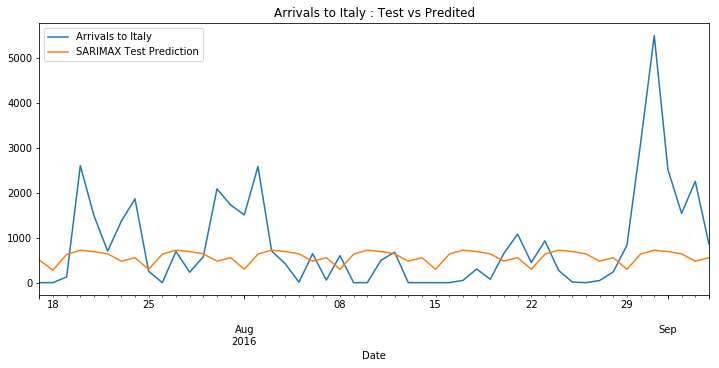

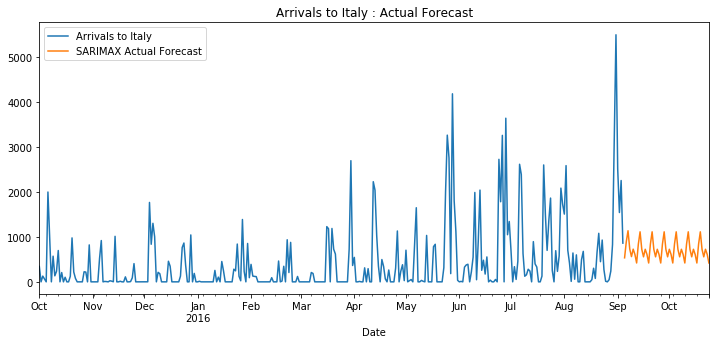

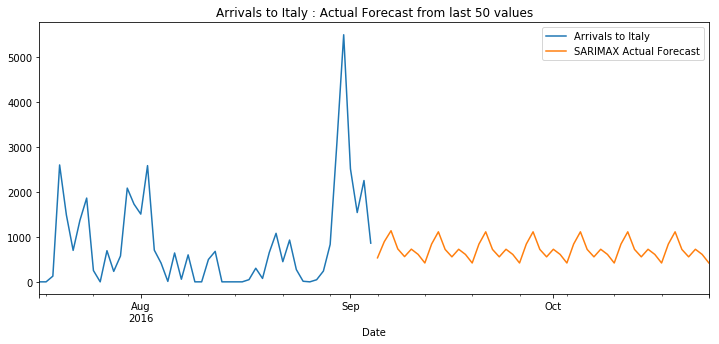

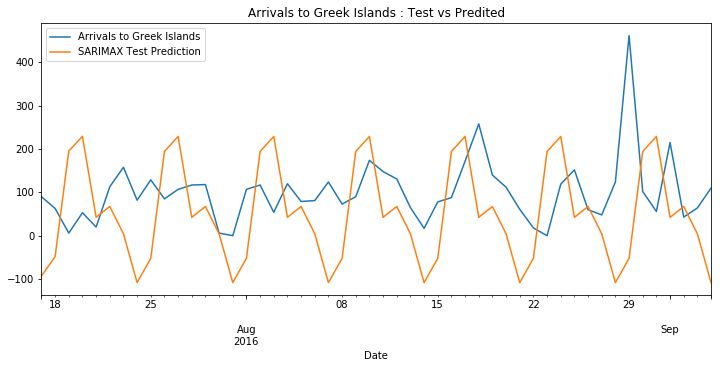

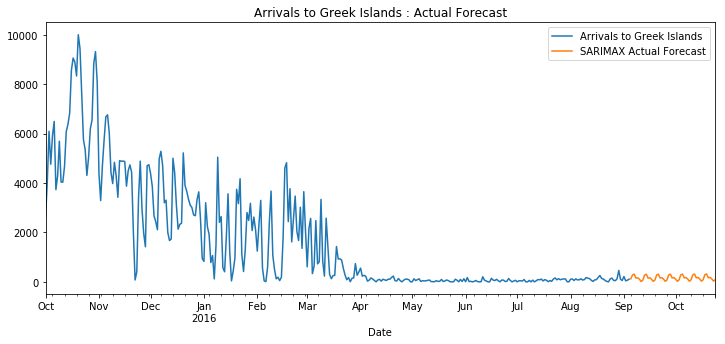

...

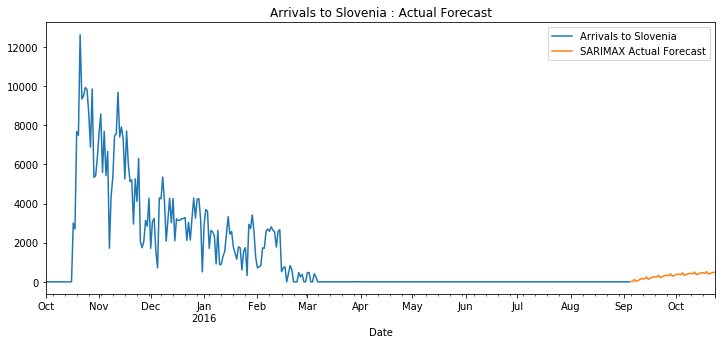

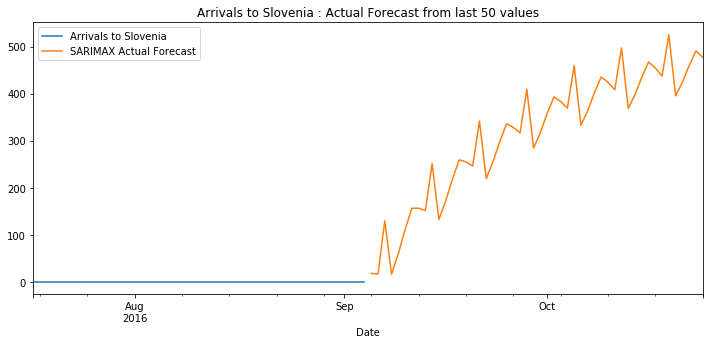

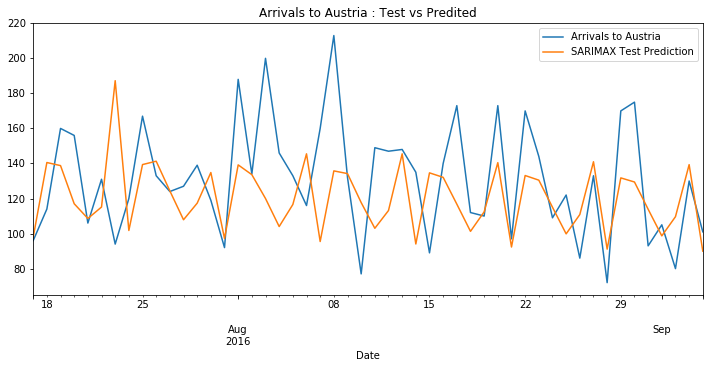

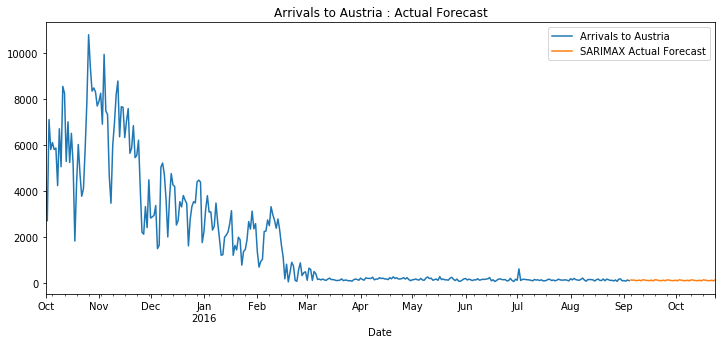

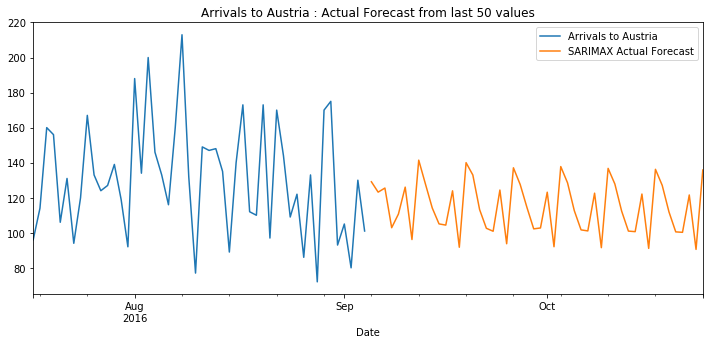

In [9]:
for country in countries:
    train = migration.iloc[:-50]
    test = migration.iloc[-50:]
    
    param_model = pm.auto_arima(migration[country], exogenous=migration[['EU Turkey Cut-Off Deal']], d=None, D=1, seasonal=True, m=7)
    print(country,' ',param_model.order, param_model.seasonal_order)
    start = len(train)
    end = len(train) + len(test) - 1

    model = SARIMAX(train[country], exog=train['EU Turkey Cut-Off Deal'],
                   order=param_model.order, seasonal_order=param_model.seasonal_order, enforce_invertibility=False)
    results = model.fit()
    prediction = results.predict(start, end, exog=test[['EU Turkey Cut-Off Deal']]).rename('SARIMAX Test Prediction')

    plt.figure();
    plt.title(label=f'{country} : Test vs Predited')
    test[country].plot(figsize=(12,5), legend=True);
    prediction.plot(legend=True);

    print('Mean Value : ',test[country].mean())
    print('MAE Value :', meanabs(test[country],prediction))
    print('RMSE Value :', np.sqrt(mean_squared_error(test[country],prediction)))

    # ACTUAL FORECAST

    start = len(migration)
    end = len(migration) + 49
    model = SARIMAX(migration[country], exog=migration['EU Turkey Cut-Off Deal'],
                   order=param_model.order, seasonal_order=param_model.seasonal_order, enforce_invertibility=False)
    results = model.fit()
    prediction = results.predict(start, end, exog=actual_migration[['EU Turkey Cut-Off Deal']].iloc[340:390]).rename('SARIMAX Actual Forecast')

    plt.figure();
    plt.title(label=f'{country} : Actual Forecast')
    migration[country].plot(figsize=(12,5), legend=True);
    prediction.plot(legend=True);

    plt.figure();
    plt.title(label=f'{country} : Actual Forecast from last 50 values')
    migration[country].iloc[-50:].plot(figsize=(12,5), legend=True);
    prediction.plot(legend=True);

# Sliding Window SARIMAX model

At iteration 1
130
100 30
Arrivals to Italy   (0, 0, 1) (1, 1, 1, 7)
Mean Value :  196.63333333333333
MAE Value : 207.17180793347077
RMSE Value : 314.0197323815374
At iteration 2
160
130 30
Arrivals to Italy   (0, 0, 1) (1, 1, 1, 7)
Mean Value :  115.33333333333333
MAE Value : 196.33156357456397
RMSE Value : 242.19101339666017
At iteration 3
190
160 30
Arrivals to Italy   (0, 0, 1) (1, 1, 1, 7)
Mean Value :  320.3
MAE Value : 383.86136747551484
RMSE Value : 598.504119783721
At iteration 4
220
190 30
Arrivals to Italy   (0, 0, 1) (0, 1, 1, 7)
Mean Value :  416.2
MAE Value : 427.570954593982
RMSE Value : 625.1885161112609
At iteration 5
250
220 30
Arrivals to Italy   (0, 0, 1) (0, 1, 1, 7)
Mean Value :  649.4666666666667
MAE Value : 690.6096498316781
RMSE Value : 1105.5404584142566
At iteration 6
280
250 30
Arrivals to Italy   (1, 0, 1) (1, 1, 1, 7)
Mean Value :  844.0333333333333
MAE Value : 847.064488725726
RMSE Value : 1162.8345440228775
At iteration 7
310
280 30
Arrivals to Italy   (

Arrivals to Austria   (3, 0, 1) (0, 1, 1, 7)
Mean Value :  181.86666666666667
MAE Value : 130.7244645429126
RMSE Value : 156.97533865383087
At iteration 5
250
220 30
Arrivals to Austria   (2, 0, 2) (2, 1, 2, 7)
Mean Value :  158.93333333333334
MAE Value : 47.06905828623538
RMSE Value : 58.43923329266711
At iteration 6
280
250 30
Arrivals to Austria   (1, 0, 1) (0, 1, 2, 7)
Mean Value :  157.53333333333333
MAE Value : 118.24634537410853
RMSE Value : 139.04315132186193
At iteration 7
310
280 30
Arrivals to Austria   (2, 0, 2) (2, 1, 2, 7)
Mean Value :  130.66666666666666
MAE Value : 27.578729086574292
RMSE Value : 35.946910771920884
At iteration 8
340
310 30
Arrivals to Austria   (1, 0, 2) (0, 1, 1, 7)
Mean Value :  128.7
MAE Value : 83.34198445704416
RMSE Value : 105.04091808720419


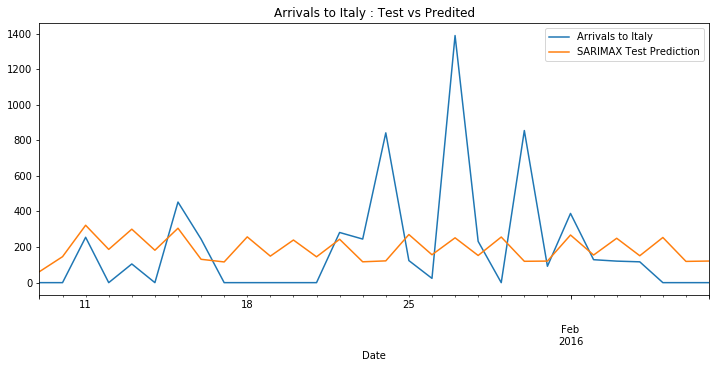

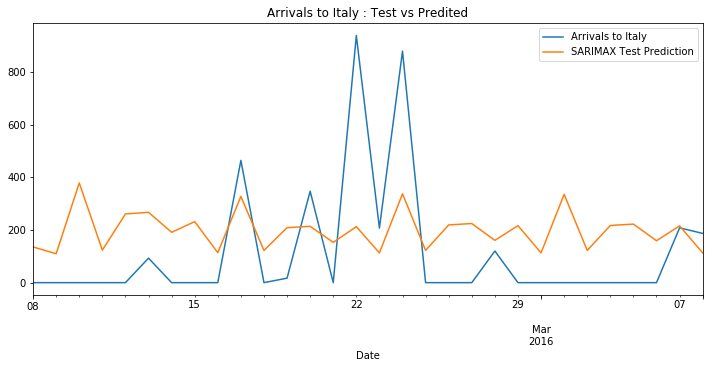

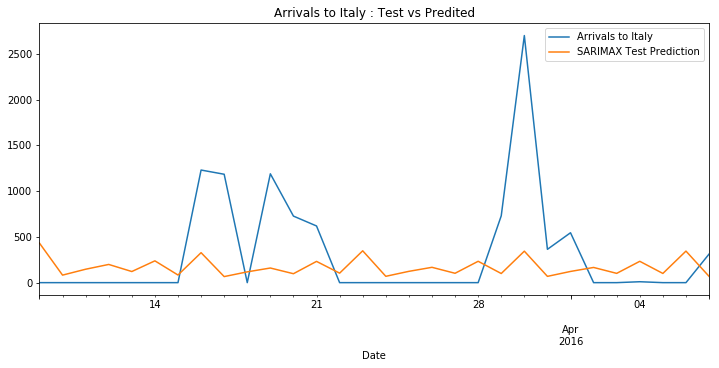

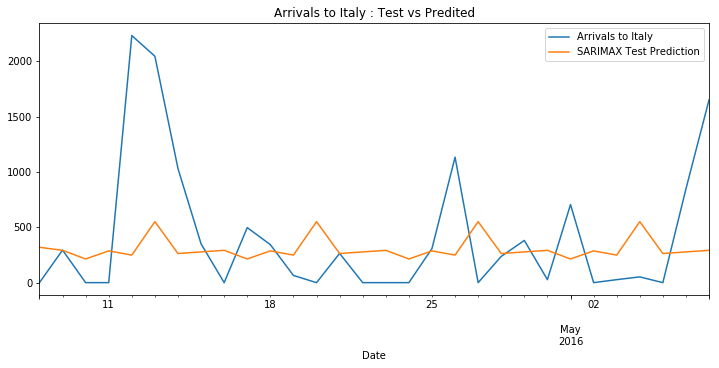

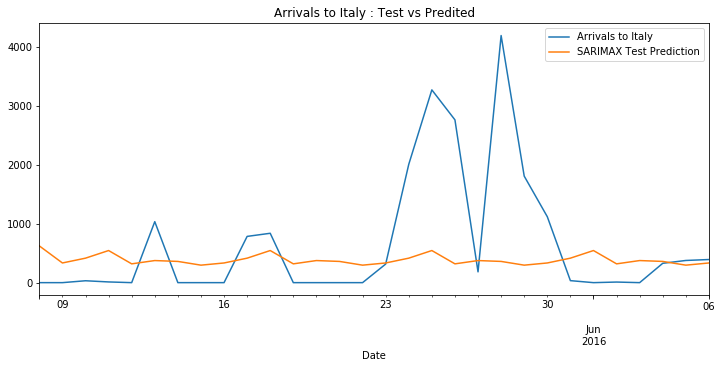

...

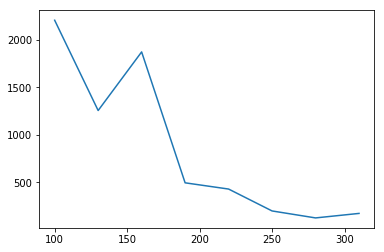

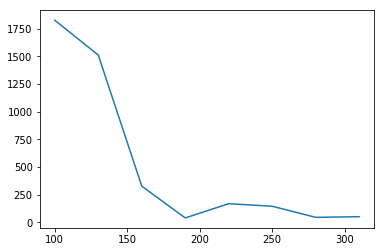

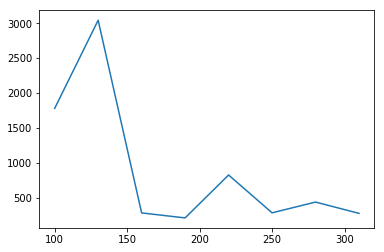

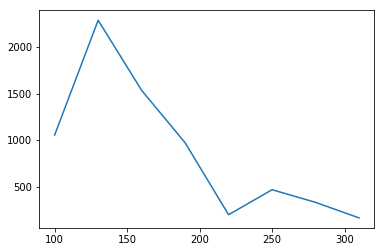

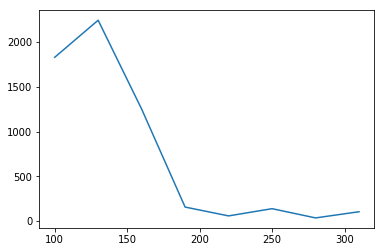

In [18]:
sarimax_performance=[]
countries_sliding = ['Arrivals to Italy', 'Arrivals to Greek Islands',
       'Departures to mainland Greece', 'Arrivals to fYRoM','Arrivals to Croatia',
       'Arrivals to Slovenia', 'Arrivals to Austria']
interval = [100,130,160,190,220,250,280,310]
for country in countries_sliding:
    i = 99
    count = 0
    while (i<len(migration)-1):
        count = count+1
        print ("At iteration {}".format(count))
        train = migration.iloc[0:i+1]
        test = migration.iloc[i+1:i+31]
        len_data = len(train)+len(test)
        print(len_data)
        print (len(train), len(test))
        param_model = pm.auto_arima(train[country], exogenous=train[['EU Turkey Cut-Off Deal']], d = None, D = 1, seasonal=True, m=7)
        print(country,' ',param_model.order, param_model.seasonal_order)
        start = len(train)
        end = len(train) + len(test) - 1

        model = SARIMAX(train[country], exog=train['EU Turkey Cut-Off Deal'],
                       order=param_model.order, seasonal_order=param_model.seasonal_order, enforce_invertibility=False)
        results = model.fit()
        prediction = results.predict(start, end, exog=test[['EU Turkey Cut-Off Deal']]).rename('SARIMAX Test Prediction')

        plt.figure();
        plt.title(label=f'{country} : Test vs Predited')
        test[country].plot(figsize=(12,5), legend=True);
        prediction.plot(legend=True);

        print('Mean Value : ',test[country].mean())
        print('MAE Value :', meanabs(test[country],prediction))
        print('RMSE Value :', np.sqrt(mean_squared_error(test[country],prediction)))
        rmse = np.sqrt(mean_squared_error(test[country],prediction))
        sarimax_performance.append(rmse)
        i+=len(test)
        

i = 0
while (i<len(sarimax_performance)-1):
    perf = sarimax_performance[i:i+8]
    plt.plot(interval,perf)
    plt.show();
    i = i+8

# LSTM

In [11]:
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from pandas import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from math import sqrt
from matplotlib import pyplot
import numpy
import pandas as pd

Using TensorFlow backend.


In [12]:
# frame a sequence as a supervised learning problem
def timeseries_to_supervised(data, lag=1):
    df = DataFrame(data)
    columns = [df.shift(i) for i in range(1, lag+1)]
    columns.append(df)
    df = concat(columns, axis=1)
    df.fillna(0, inplace=True)
    return df

# create a differenced series
def difference(dataset, interval=7):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)

# invert differenced value
def inverse_difference(history, yhat, interval=7):
    return yhat + history[-interval]

# scale train and test data to [-1, 1]
def scale(train, test):
    # fit scaler
    scaler = MinMaxScaler(feature_range=(-1, 1))
    scaler = scaler.fit(train)
    # transform train
    train = train.reshape(train.shape[0], train.shape[1])
    train_scaled = scaler.transform(train)
    # transform test
    test = test.reshape(test.shape[0], test.shape[1])
    test_scaled = scaler.transform(test)
    return scaler, train_scaled, test_scaled

# inverse scaling for a forecasted value
def invert_scale(scaler, X, value):
    new_row = [x for x in X] + [value]
    array = numpy.array(new_row)
    array = array.reshape(1, len(array))
    inverted = scaler.inverse_transform(array)
    return inverted[0, -1]

# fit an LSTM network to training data
def fit_lstm(train, batch_size, nb_epoch, neurons):
    X, y = train[:, 0:-1], train[:, -1]
    X = X.reshape(X.shape[0], 1, X.shape[1])
    model = Sequential()
    model.add(LSTM(neurons, batch_input_shape=(batch_size, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    for i in range(nb_epoch):
        model.fit(X, y, epochs=1, batch_size=batch_size, verbose=0, shuffle=False)
        model.reset_states()
    return model

# make a one-step forecast
def forecast_lstm(model, batch_size, X):
    X = X.reshape(1, 1, len(X))
    yhat = model.predict(X, batch_size=batch_size)
    return yhat[0,0]


In [13]:
# load dataset
migration1 = pd.read_csv("C://Users//divakar//TSA//TSA/refugeedata_ex.csv", index_col='Date', squeeze=True)
series = migration1.iloc[0:341]
series = series.replace(',','',regex=True)
series = series.apply(pd.to_numeric)
series.interpolate(inplace=True)

# Sliding Window LSTM Model

W0916 02:31:41.274057   468 deprecation_wrapper.py:119] From C:\Users\divakar\Anaconda3\lib\site-packages\keras\backend\tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0916 02:31:41.307040   468 deprecation_wrapper.py:119] From C:\Users\divakar\Anaconda3\lib\site-packages\keras\backend\tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0916 02:31:41.314036   468 deprecation_wrapper.py:119] From C:\Users\divakar\Anaconda3\lib\site-packages\keras\backend\tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.



Arrivals to Italy
340
At iteration 1
100 30


W0916 02:31:41.640894   468 deprecation_wrapper.py:119] From C:\Users\divakar\Anaconda3\lib\site-packages\keras\optimizers.py:790: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.

W0916 02:31:41.885434   468 deprecation.py:323] From C:\Users\divakar\Anaconda3\lib\site-packages\tensorflow\python\ops\math_grad.py:1250: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
W0916 02:31:42.439286   468 deprecation_wrapper.py:119] From C:\Users\divakar\Anaconda3\lib\site-packages\keras\backend\tensorflow_backend.py:986: The name tf.assign_add is deprecated. Please use tf.compat.v1.assign_add instead.

W0916 02:31:42.546017   468 deprecation_wrapper.py:119] From C:\Users\divakar\Anaconda3\lib\site-packages\keras\backend\tensorflow_backend.py:973: The name tf.assign is deprecated. 

Mean Value :  196.63333333333333
MAE Value : 768.9851893613736
RMSE Value : 1376.0350577748834


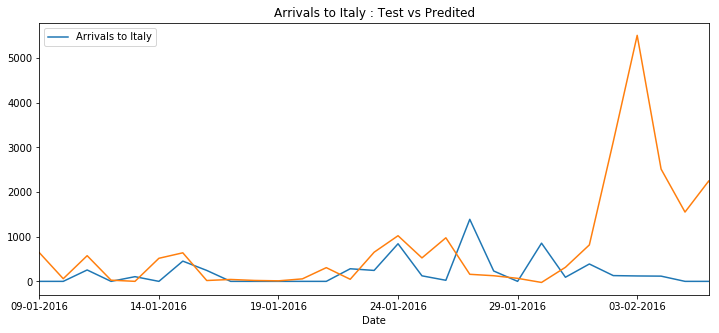

At iteration 2
130 30
Mean Value :  115.33333333333333
MAE Value : 754.6238928665717
RMSE Value : 1391.366251259184


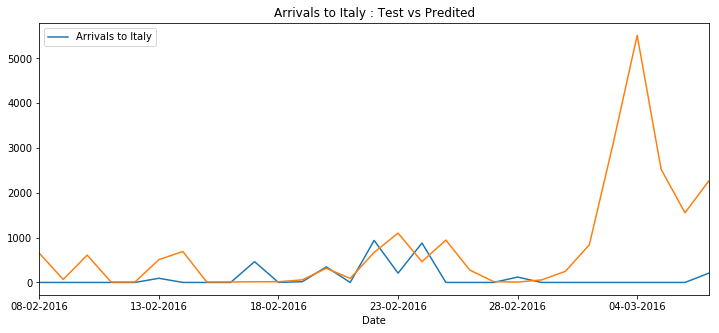

At iteration 3
160 30
Mean Value :  320.3
MAE Value : 1019.3029270986716
RMSE Value : 1558.4524163102567


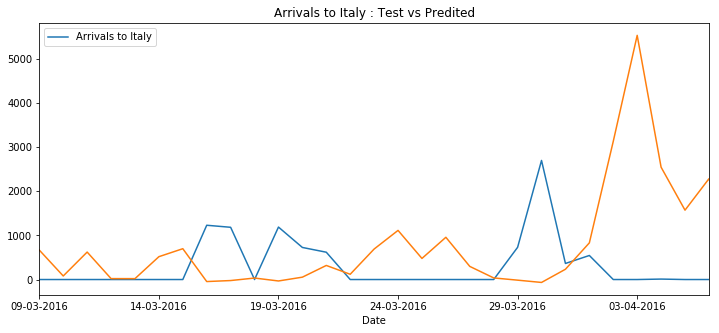

At iteration 4
190 30
Mean Value :  416.2
MAE Value : 921.2928411910931
RMSE Value : 1477.6466924957865


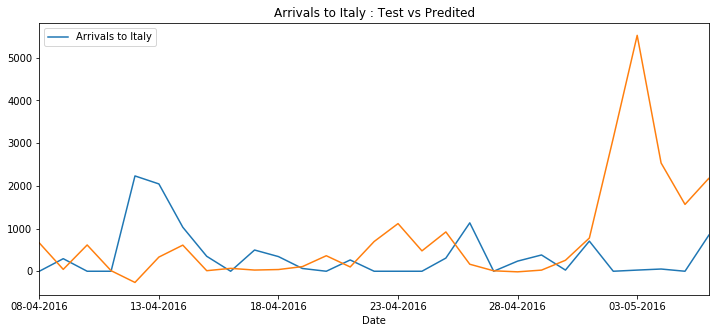

At iteration 5
220 30
Mean Value :  649.4666666666667
MAE Value : 1448.612070166692
RMSE Value : 2047.6836974654625


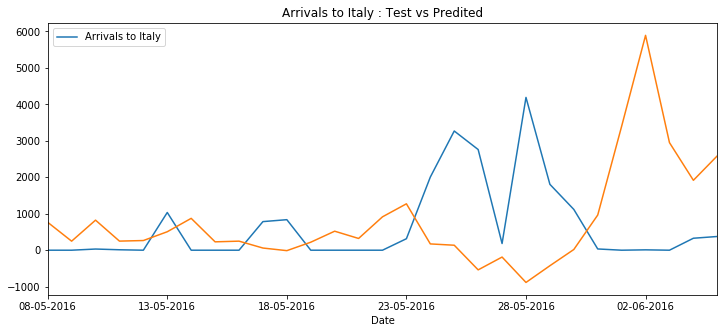

At iteration 6
250 30
Mean Value :  844.0333333333333
MAE Value : 1362.3851577008763
RMSE Value : 1949.543164418919


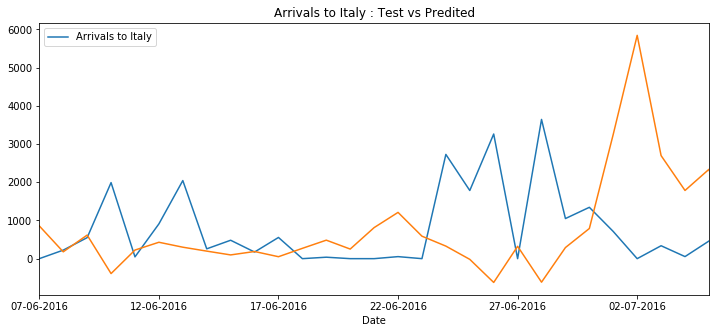

At iteration 7
280 30
Mean Value :  813.8333333333334
MAE Value : 791.0073062479495
RMSE Value : 1158.8491907965588


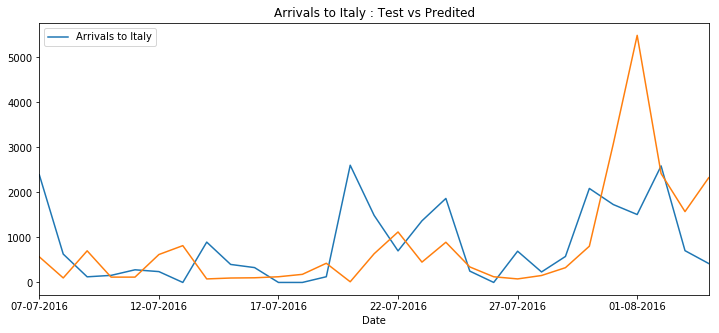

At iteration 8
310 30
Mean Value :  773.8
MAE Value : 400.10216295657096
RMSE Value : 422.32279353832763


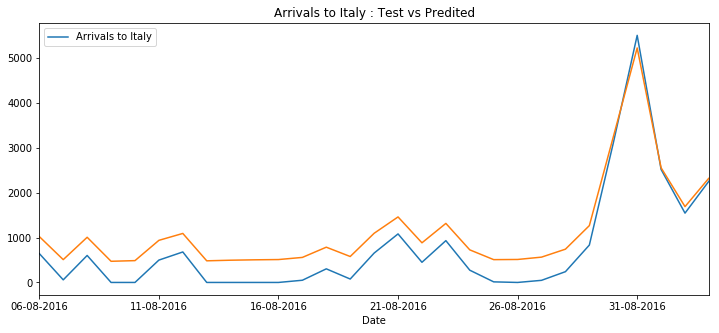

Arrivals to Greek Islands
340
At iteration 1
100 30
Mean Value :  1880.0666666666666
MAE Value : 1770.5295195793112
RMSE Value : 2199.0498881692347


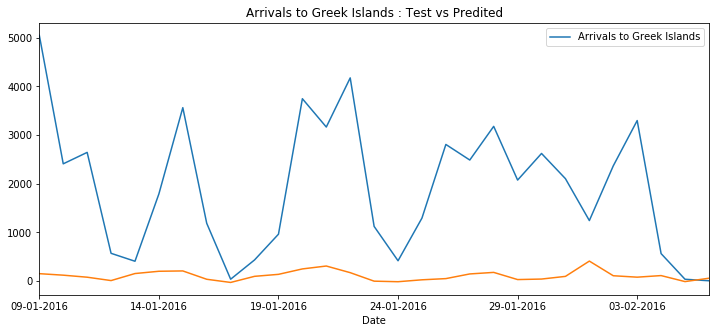

At iteration 2
130 30
Mean Value :  1913.8
MAE Value : 1869.3035136369367
RMSE Value : 2397.923651848654


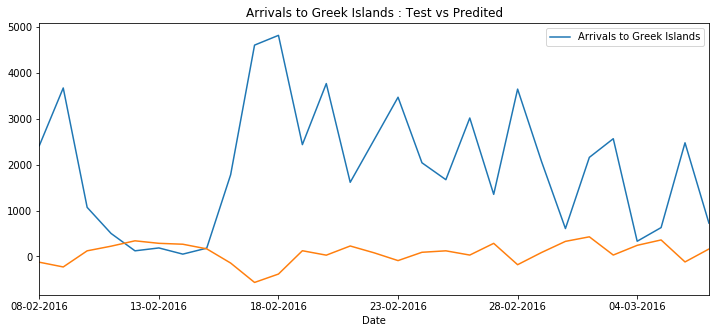

At iteration 3
160 30
Mean Value :  594.4333333333333
MAE Value : 478.9495898837844
RMSE Value : 915.4734384824642


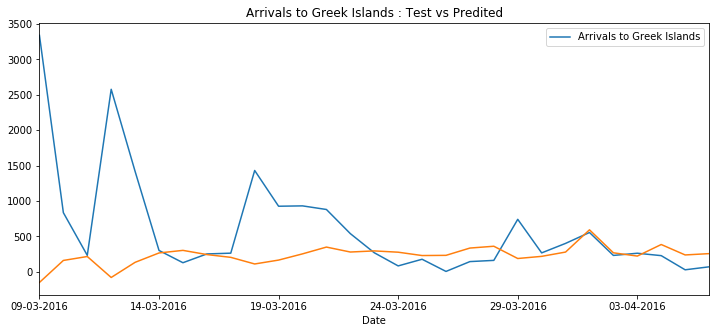

At iteration 4
190 30
Mean Value :  77.86666666666666
MAE Value : 73.77014251061094
RMSE Value : 104.12773685654285


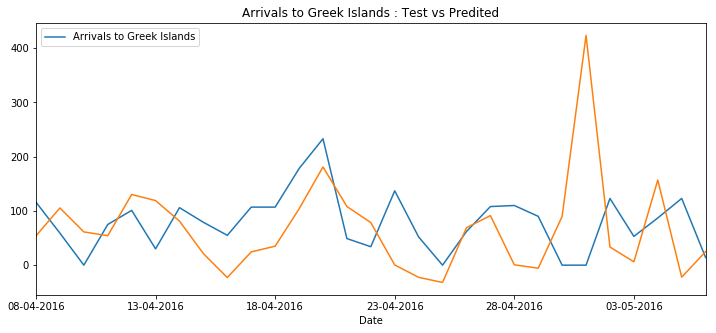

At iteration 5
220 30
Mean Value :  41.666666666666664
MAE Value : 64.25920439884067
RMSE Value : 90.12583422014265


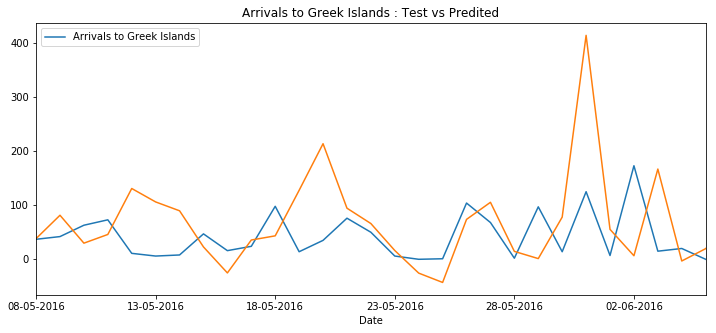

At iteration 6
250 30
Mean Value :  49.06666666666667
MAE Value : 63.084346634149554
RMSE Value : 87.94996777379635


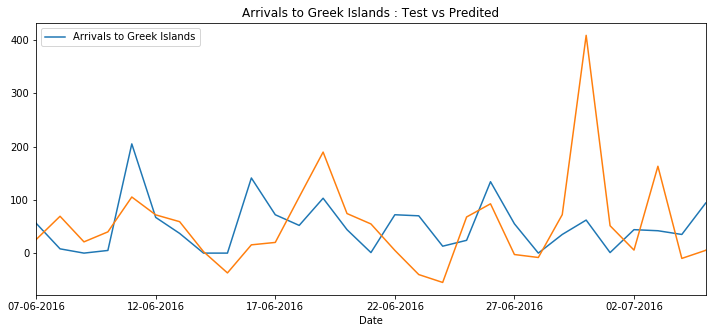

At iteration 7
280 30
Mean Value :  70.53333333333333
MAE Value : 151.998358998696
RMSE Value : 189.07534838527212


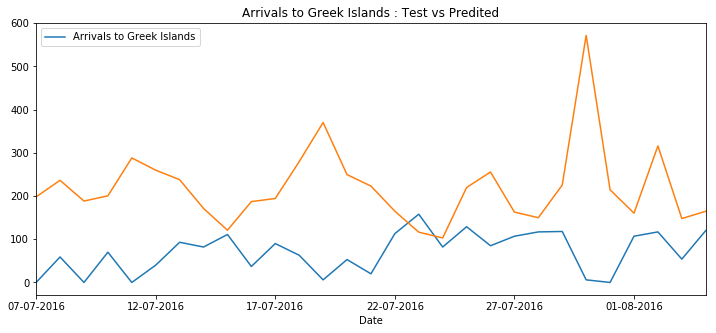

At iteration 8
310 30
Mean Value :  112.83333333333333
MAE Value : 7.913416860500968
RMSE Value : 10.913710428093804


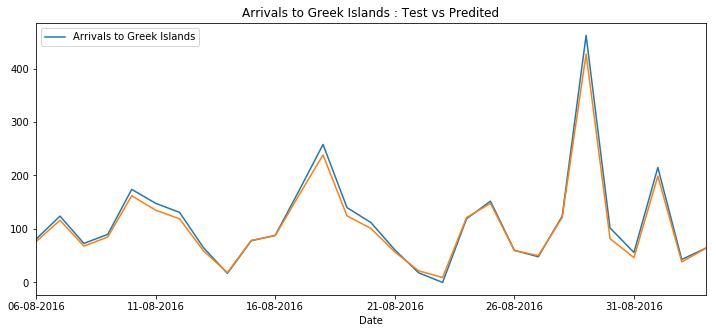

Departures to mainland Greece
340
At iteration 1
100 30
Mean Value :  1859.4
MAE Value : 1908.5491823080931
RMSE Value : 2567.1805917695915


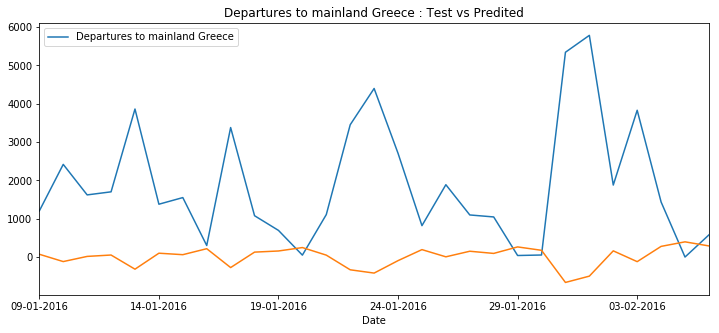

At iteration 2
130 30
Mean Value :  1756.8
MAE Value : 1797.6518507007515
RMSE Value : 2233.01759046407


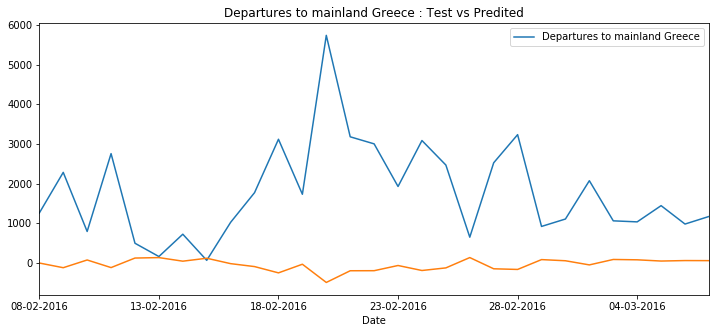

At iteration 3
160 30
Mean Value :  543.2333333333333
MAE Value : 520.2953235467278
RMSE Value : 1029.391251558307


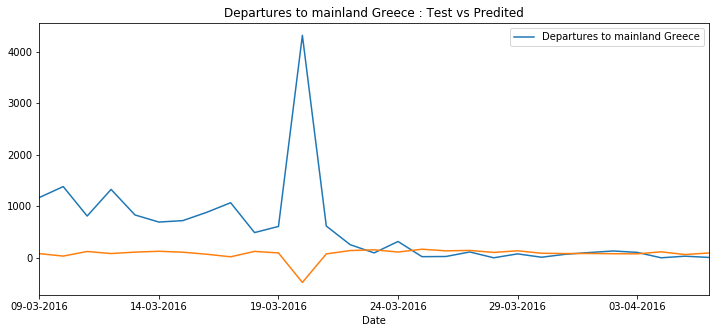

At iteration 4
190 30
Mean Value :  22.066666666666666
MAE Value : 26.714447242021834
RMSE Value : 35.85504032698671


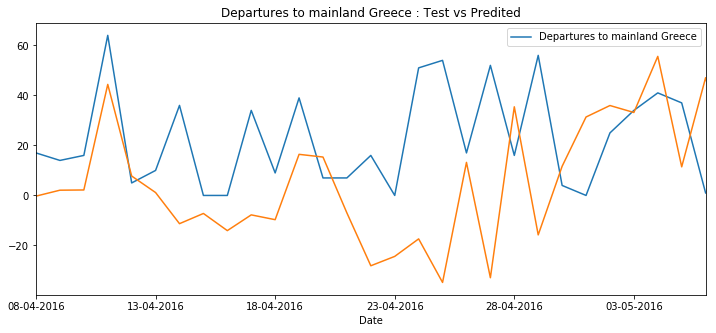

At iteration 5
220 30
Mean Value :  46.333333333333336
MAE Value : 78.04257066125605
RMSE Value : 86.03245892163079


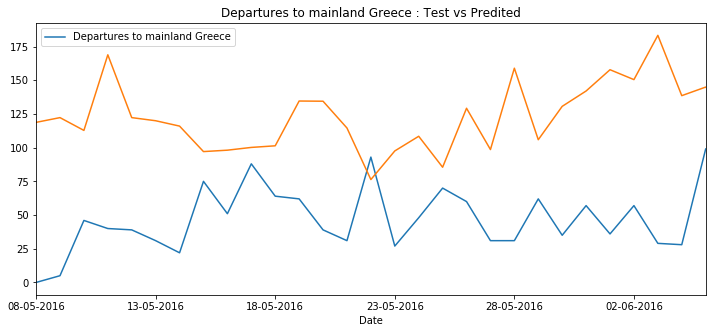

At iteration 6
250 30
Mean Value :  49.03333333333333
MAE Value : 293.118491953612
RMSE Value : 296.2604759942345


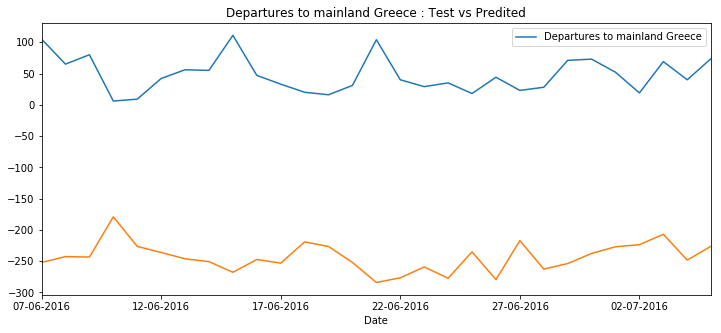

At iteration 7
280 30
Mean Value :  47.96666666666667
MAE Value : 243.29744601032314
RMSE Value : 246.15054458657042


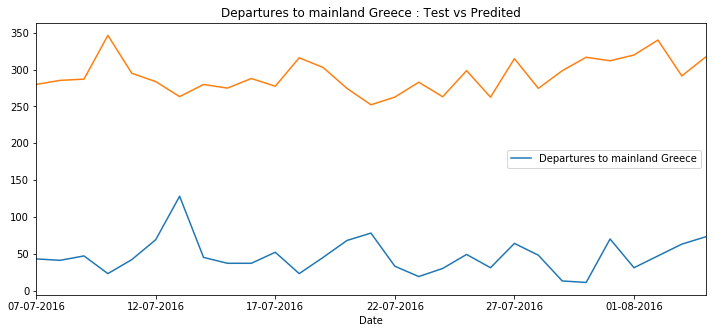

At iteration 8
310 30
Mean Value :  32.63333333333333
MAE Value : 193.2341631948955
RMSE Value : 193.3514129154656


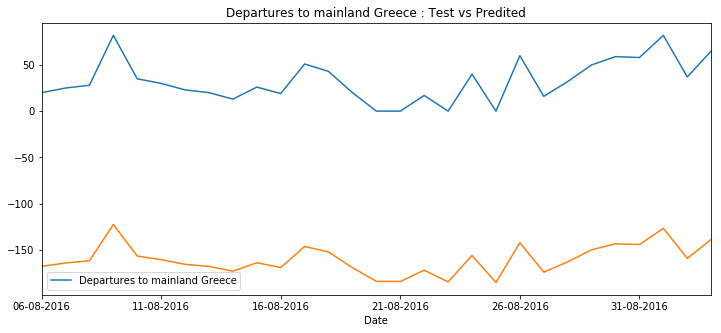

Arrivals to fYRoM
340
At iteration 1
100 30
Mean Value :  1693.9
MAE Value : 1783.3570106804366
RMSE Value : 2020.8561809042328


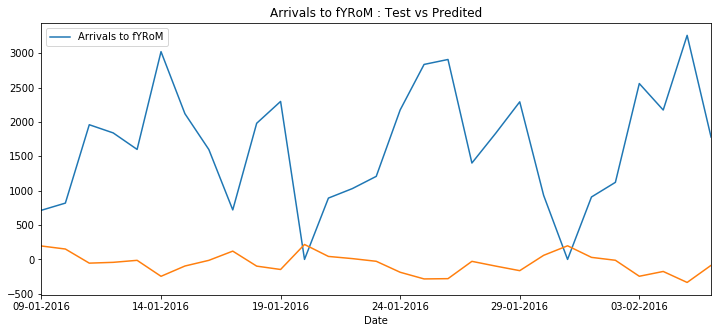

At iteration 2
130 30
Mean Value :  708.7
MAE Value : 740.3934883834789
RMSE Value : 1076.314899086843


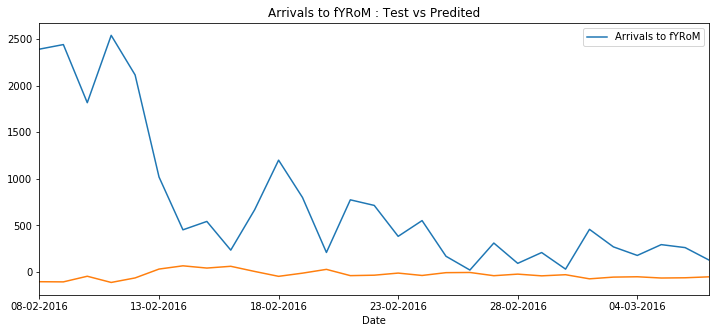

At iteration 3
160 30
Mean Value :  0.0
MAE Value : 63.08725072151619
RMSE Value : 63.957208504216936


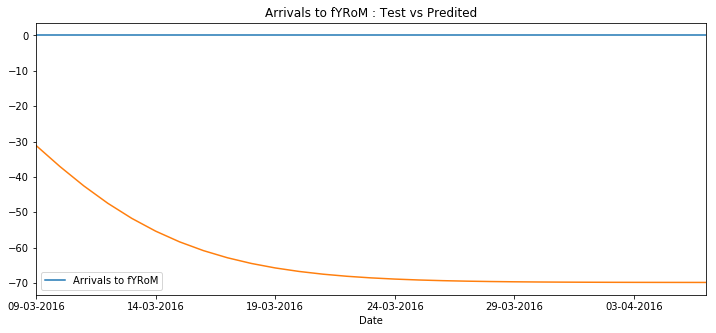

At iteration 4
190 30
Mean Value :  0.0
MAE Value : 71.83987653062938
RMSE Value : 71.84099580988634


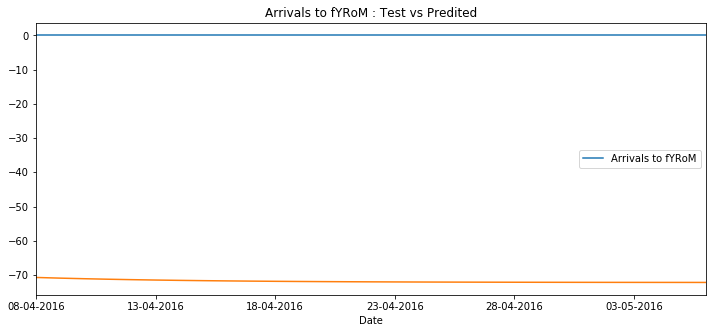

At iteration 5
220 30
Mean Value :  0.0
MAE Value : 2.9256910304233714
RMSE Value : 3.005977156972715


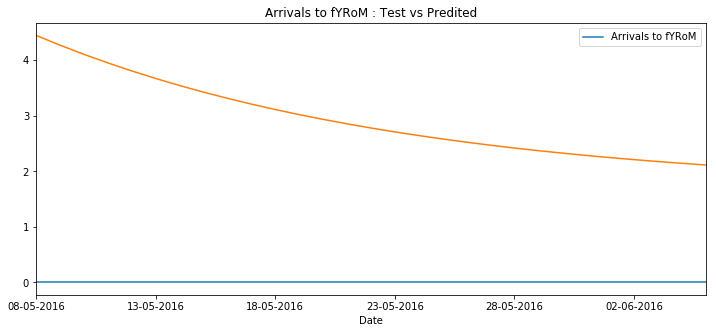

At iteration 6
250 30
Mean Value :  0.0
MAE Value : 108.15555947764415
RMSE Value : 108.15823624680877


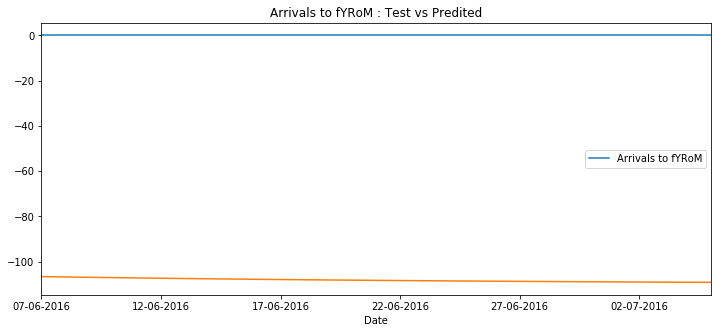

At iteration 7
280 30
Mean Value :  0.0
MAE Value : 2.6156606860453606
RMSE Value : 2.615660686045361


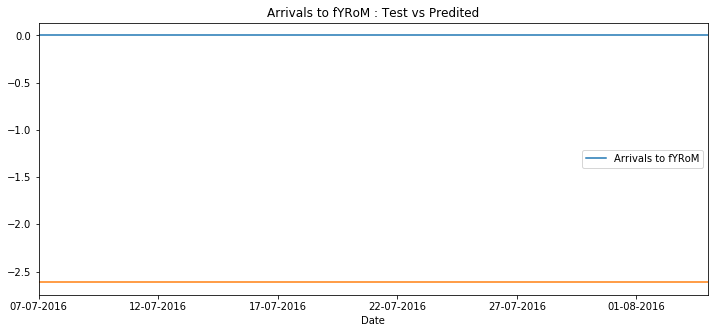

At iteration 8
310 30
Mean Value :  0.0
MAE Value : 0.07499688491172804
RMSE Value : 0.07499688491172808


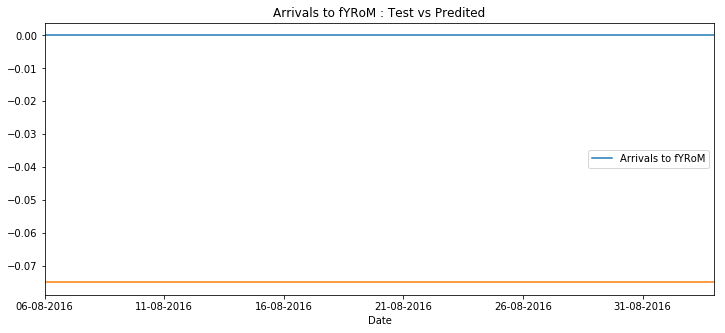

Arrivals to Croatia
340
At iteration 1
100 30
Mean Value :  1825.7
MAE Value : 1876.48049020643
RMSE Value : 2103.370149094749


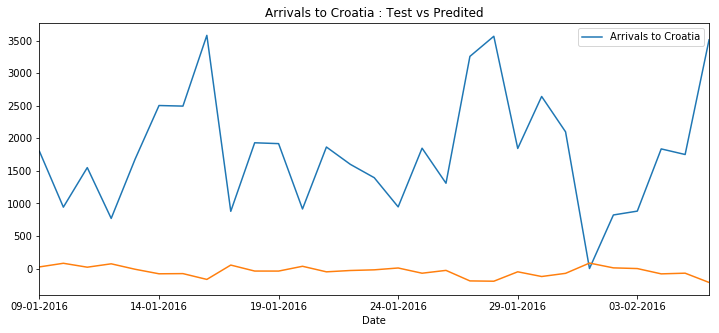

At iteration 2
130 30
Mean Value :  816.9666666666667
MAE Value : 880.4339655394353
RMSE Value : 1311.7162410273186


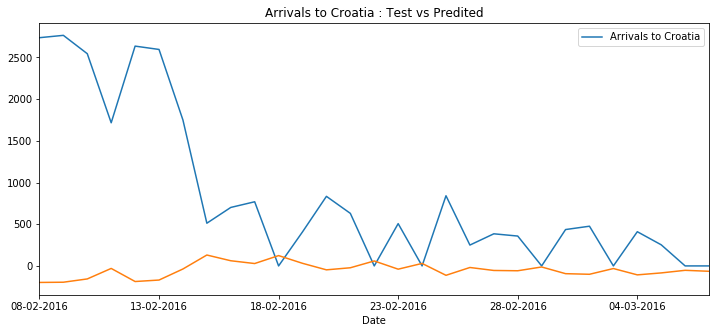

At iteration 3
160 30
Mean Value :  0.0
MAE Value : 61.221425297856044
RMSE Value : 61.35040153398974


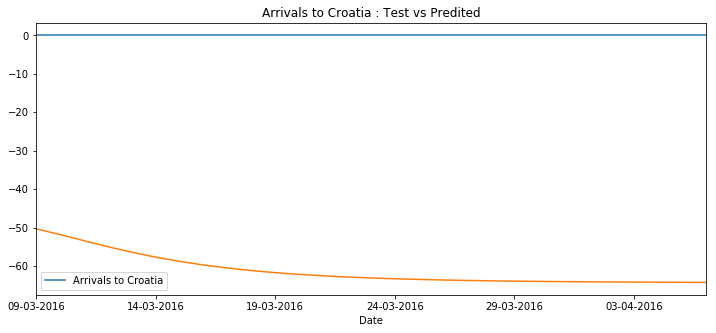

At iteration 4
190 30
Mean Value :  0.0
MAE Value : 23.294728143512888
RMSE Value : 23.29473107182208


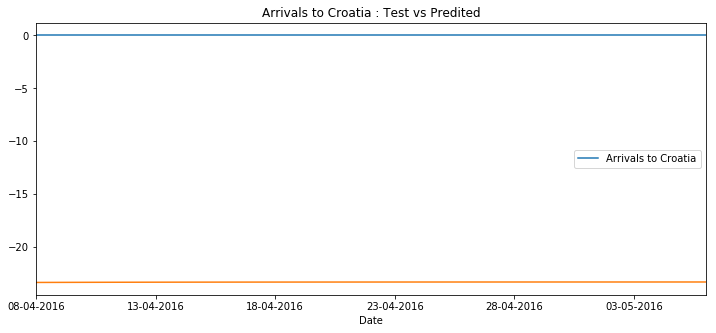

At iteration 5
220 30
Mean Value :  0.0
MAE Value : 9.903584620356252
RMSE Value : 9.94104920385548


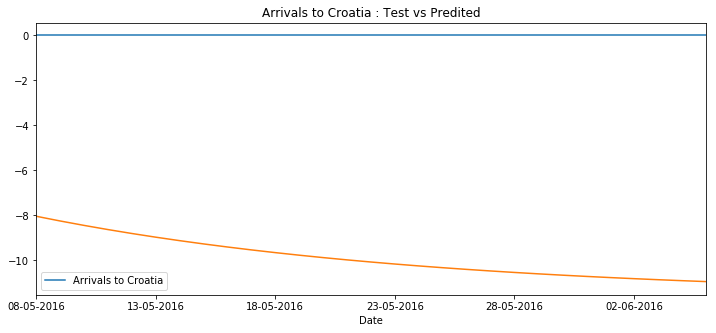

At iteration 6
250 30
Mean Value :  0.0
MAE Value : 12.04578015208214
RMSE Value : 12.045780152082134


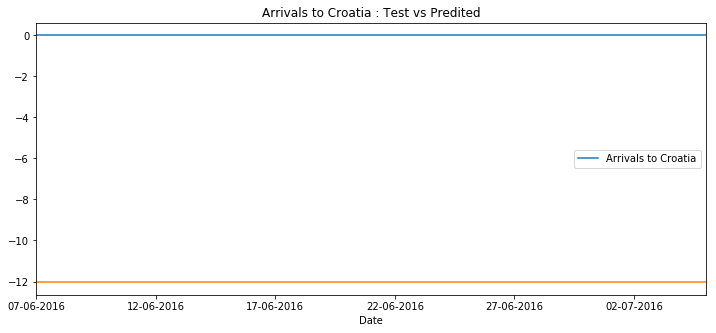

At iteration 7
280 30
Mean Value :  0.0
MAE Value : 6.850333487987208
RMSE Value : 6.850334575122237


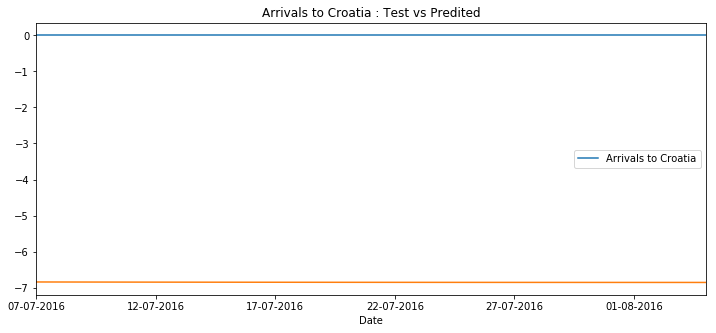

At iteration 8
310 30
Mean Value :  0.0
MAE Value : 40.64953335374564
RMSE Value : 40.649534161015524


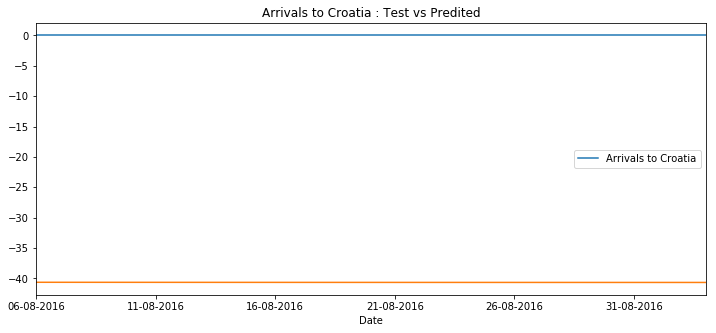

Arrivals to Slovenia
340
At iteration 1
100 30
Mean Value :  1804.6666666666667
MAE Value : 1787.402171848334
RMSE Value : 1957.1512111490938


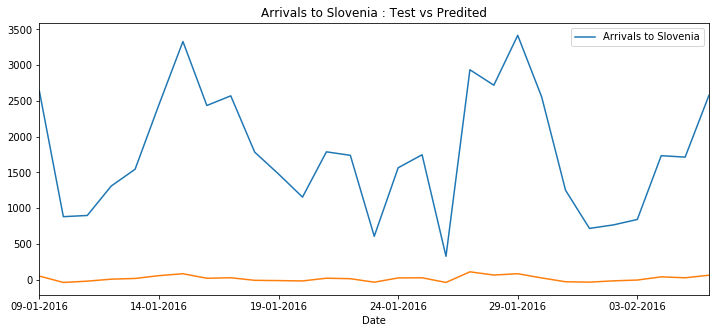

At iteration 2
130 30
Mean Value :  805.3333333333334
MAE Value : 826.6485868404309
RMSE Value : 1305.756316024074


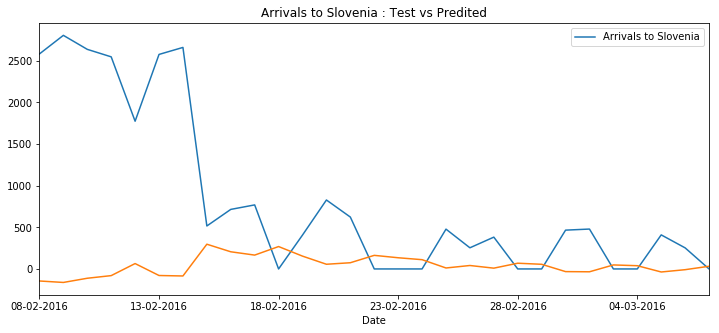

At iteration 3
160 30
Mean Value :  0.5666666666666667
MAE Value : 63.29432579424854
RMSE Value : 64.07327908426947


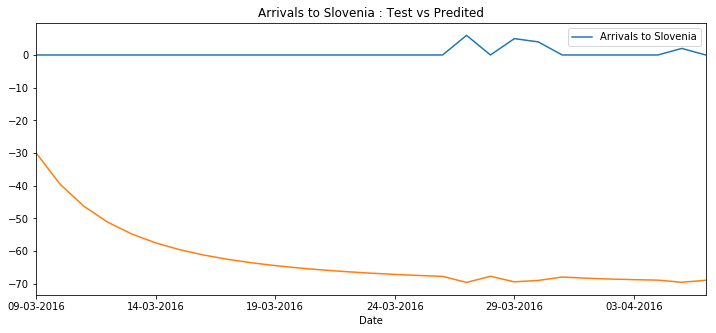

At iteration 4
190 30
Mean Value :  0.0
MAE Value : 69.61133159343154
RMSE Value : 69.61184024563124


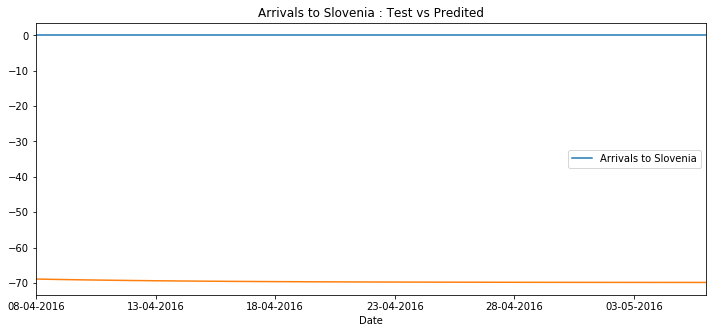

At iteration 5
220 30
Mean Value :  0.0
MAE Value : 19.96987817492337
RMSE Value : 19.969882763529128


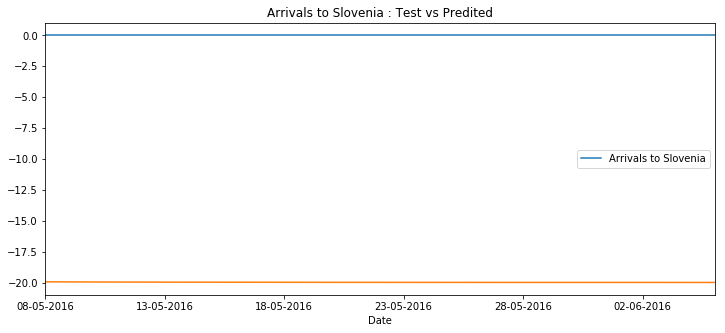

At iteration 6
250 30
Mean Value :  0.0
MAE Value : 14.725661394186327
RMSE Value : 14.725661394186332


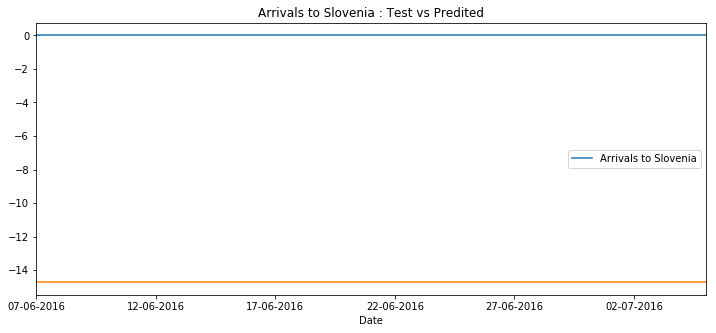

At iteration 7
280 30
Mean Value :  0.0
MAE Value : 8.124408916570255
RMSE Value : 8.124408916570259


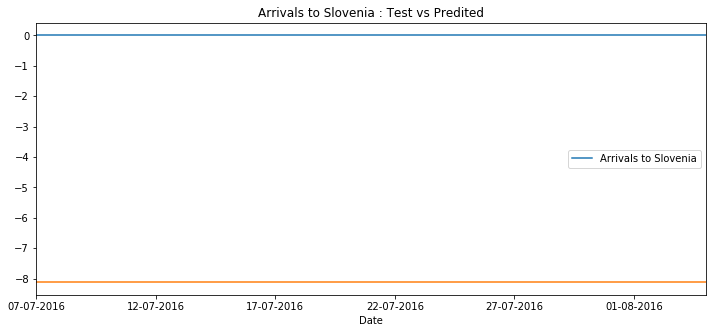

At iteration 8
310 30
Mean Value :  0.0
MAE Value : 1.4626611312851432
RMSE Value : 1.4626611312851432


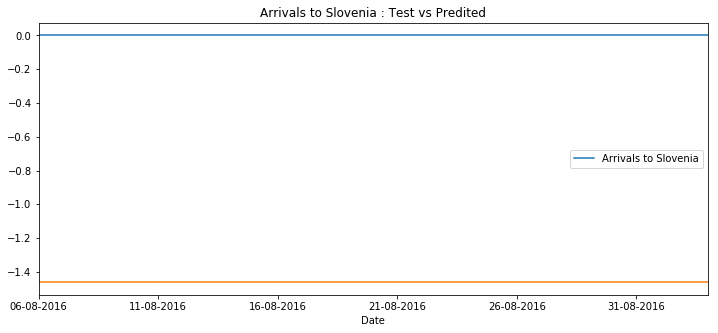

Arrivals to Austria
340
At iteration 1
100 30
Mean Value :  1897.0
MAE Value : 1829.2675155096997
RMSE Value : 1995.5708071775823


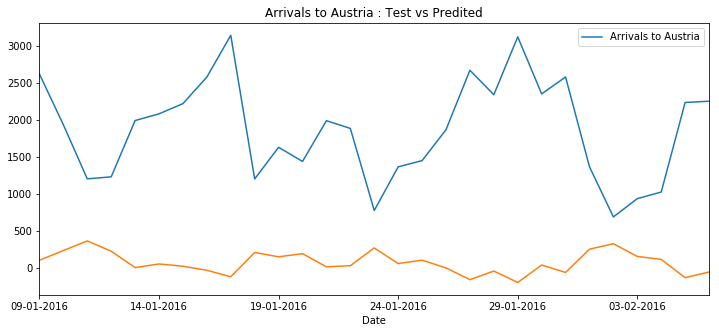

At iteration 2
130 30
Mean Value :  1016.3
MAE Value : 961.5073614762475
RMSE Value : 1434.3776506701447


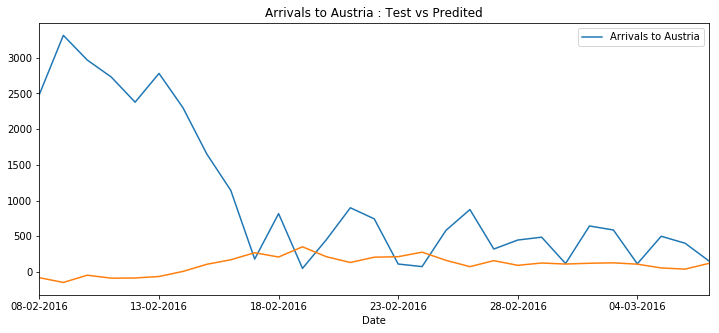

At iteration 3
160 30
Mean Value :  146.66666666666666
MAE Value : 112.86989817246804
RMSE Value : 126.94261965010215


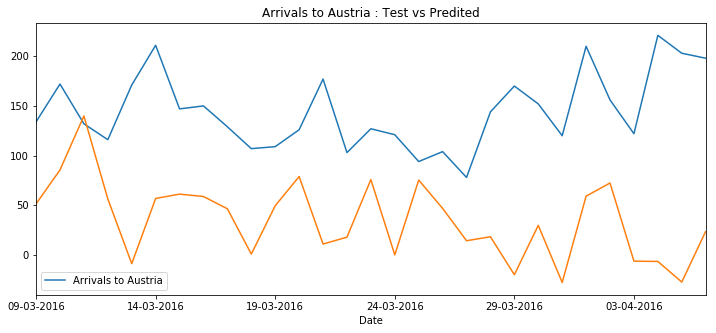

At iteration 4
190 30
Mean Value :  181.86666666666667
MAE Value : 112.13507488543799
RMSE Value : 126.73922436495747


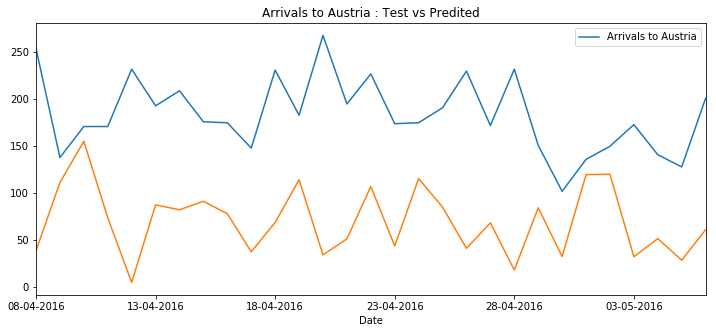

At iteration 5
220 30
Mean Value :  158.93333333333334
MAE Value : 63.47772387812544
RMSE Value : 82.6755171395066


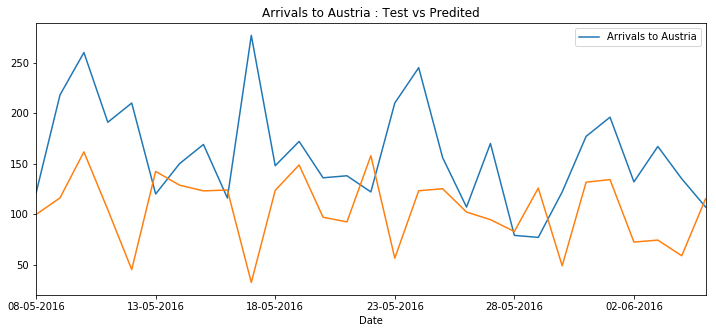

At iteration 6
250 30
Mean Value :  157.53333333333333
MAE Value : 57.39014956330264
RMSE Value : 117.74586098494723


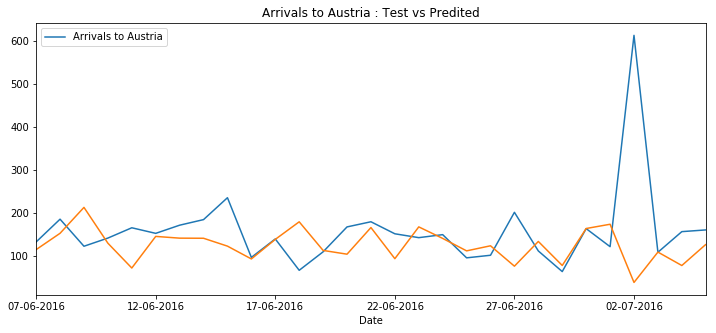

At iteration 7
280 30
Mean Value :  130.66666666666666
MAE Value : 46.1733959130943
RMSE Value : 55.1448191175718


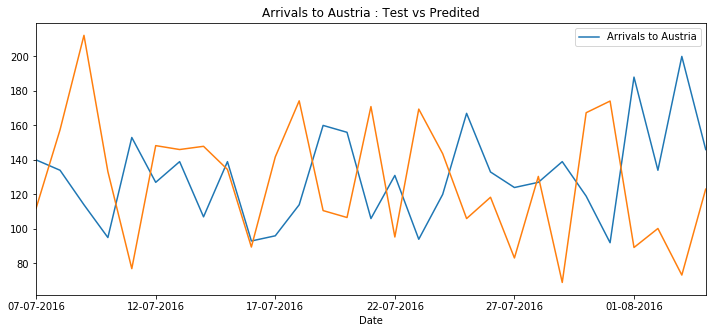

At iteration 8
310 30
Mean Value :  128.7
MAE Value : 7.775849761565602
RMSE Value : 9.839924615280879


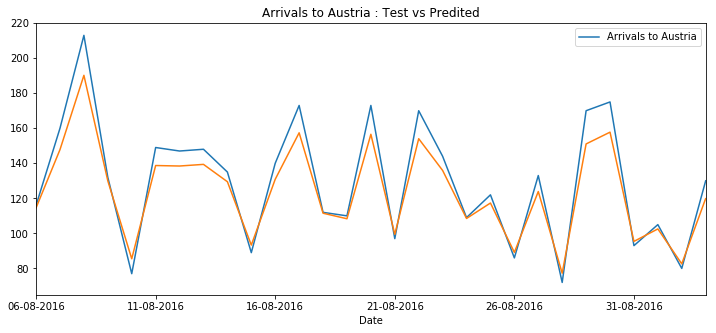

In [14]:
i = 0
LSTM_performance=[]
interval = [100,130,160,190,220,250,280,310]
#column_names = ['Arrivals to Italy', 'Arrivals to Greek Islands','Departures to mainland Greece','Arrivals to fYRoM','Arrivals to Serbia','Arrivals to Croatia','Arrivals to Hungary','Arrivals to Slovenia','Arrivals to Austria']
column_names = ['Arrivals to Italy', 'Arrivals to Greek Islands',
       'Departures to mainland Greece', 'Arrivals to fYRoM','Arrivals to Croatia',
       'Arrivals to Slovenia', 'Arrivals to Austria']
for index,country in enumerate(column_names):
    #series = series['Arrivals to Greek Islands']
    raw_values = series[country].values
    diff_values = difference(raw_values, 1)
    print(column_names[index])
    index=index+1
    
    # transform data to be supervised learning
    supervised = timeseries_to_supervised(diff_values, 1)
    supervised_values = supervised.values
    print(len(supervised_values))
    # split data into train and test-sets
    
    #train, test = supervised_values[0:300], supervised_values[300:-1]
    #print (len(train))
    j = 99
    count = 0
    while (j<len(supervised_values)-1):
        
        count = count+1
        print ("At iteration {}".format(count))
        train = supervised_values[0:j+1]
        test = supervised_values[j+1:j+31]
        print (len(train), len(test))
        
    
        # transform data to be supervised learning
        supervised = timeseries_to_supervised(diff_values, 1)
        supervised_values = supervised.values
    
        # split data into train and test-sets
        #train, test = supervised_values[0:300], supervised_values[300:-1]
        #print (len(train))
    
        # transform the scale of the data
        scaler, train_scaled, test_scaled = scale(train, test)
    
        lstm_model = fit_lstm(train_scaled, 1, 5, 4)
        train_reshaped = train_scaled[:, 0]
        train_reshaped = train_scaled[:, 0].reshape(len(train_scaled), 1, 1)
    
        lstm_model.predict(train_reshaped, batch_size=1)
    
    
        # walk-forward validation on the test data
        predictions = list()
        for i in range(len(test_scaled)):
        # make one-step forecast
            X, y = test_scaled[i, 0:-1], test_scaled[i, -1]
            yhat = forecast_lstm(lstm_model, 1, X)
        # invert scaling
            yhat = invert_scale(scaler, X, yhat)
        # invert differencing
            yhat = inverse_difference(raw_values, yhat, len(test_scaled)+1-i)
        # store forecast
            predictions.append(yhat)
            expected = raw_values[len(train) + i]
            #print('Date=%d, Predicted=%f, Expected=%f' % (i+1, yhat, expected))
    
        
        print('Mean Value : ',raw_values[j+1:j+31].mean())
        print('MAE Value :', meanabs(raw_values[j+1:j+31],predictions))
        print('RMSE Value :', np.sqrt(mean_squared_error(raw_values[j+1:j+31],predictions)))
        rmse = np.sqrt(mean_squared_error(raw_values[j+1:j+31],predictions))
        LSTM_performance.append(rmse)
        # line plot of observed vs predicted
        #pyplot.plot(raw_values[301:])
        #pyplot.plot(predictions)
        #pyplot.show()

        pyplot.figure();
        pyplot.title(label=f'{country} : Test vs Predited')
        series[country].iloc[j+1:j+30].plot(figsize=(12,5), legend=True)
        pyplot.plot(predictions)
        pyplot.show()
        j = j+30




# Simple LSTM Model

Arrivals to Italy
Mean Value :  860.8
MAE Value : 622.8675979686343
RMSE Value : 865.3503857384056
Arrivals to Greek Islands
Mean Value :  100.58
MAE Value : 64.78398171007633
RMSE Value : 95.86478351169332
Departures to mainland Greece
Mean Value :  37.64
MAE Value : 21.266635490953895
RMSE Value : 25.609177792934013
Arrivals to fYRoM
Mean Value :  0.0
MAE Value : 6.329826585947943
RMSE Value : 6.329826585947943
Arrivals to Serbia
Mean Value :  242.0
MAE Value : 20.95035856962274
RMSE Value : 25.75613623209634
Arrivals to Croatia
Mean Value :  0.0
MAE Value : 2.6901058810946226
RMSE Value : 2.690105900340163
Arrivals to Hungary
Mean Value :  38.62
MAE Value : 11.17642661422498
RMSE Value : 15.569364873536973
Arrivals to Slovenia
Mean Value :  0.0
MAE Value : 2.846263709478092
RMSE Value : 2.8462637094780923
Arrivals to Austria
Mean Value :  130.9
MAE Value : 39.36323022916913
RMSE Value : 47.884592623864094


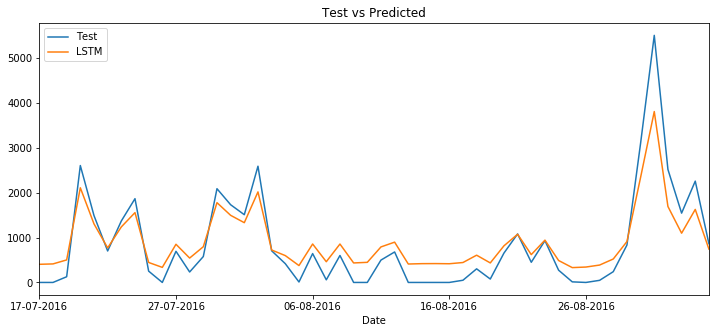

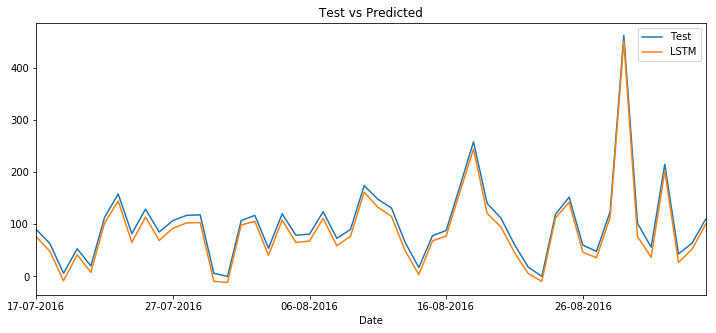

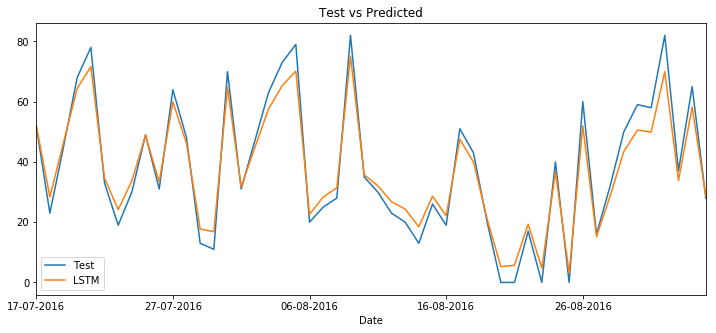

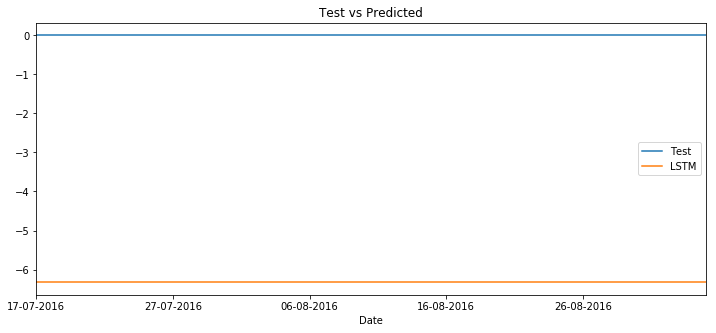

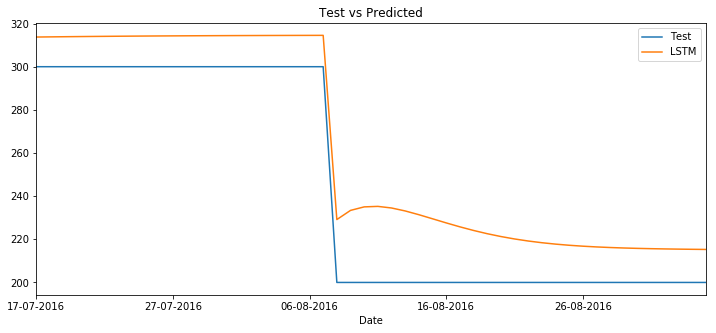

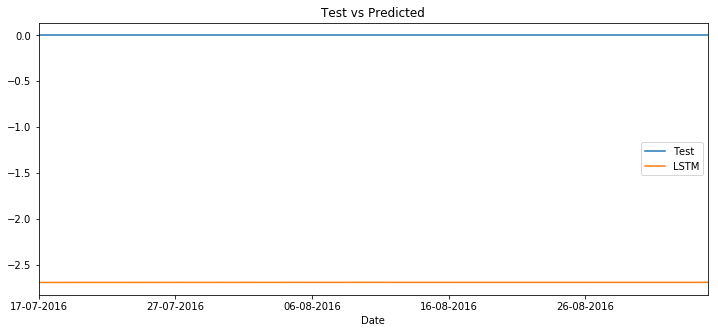

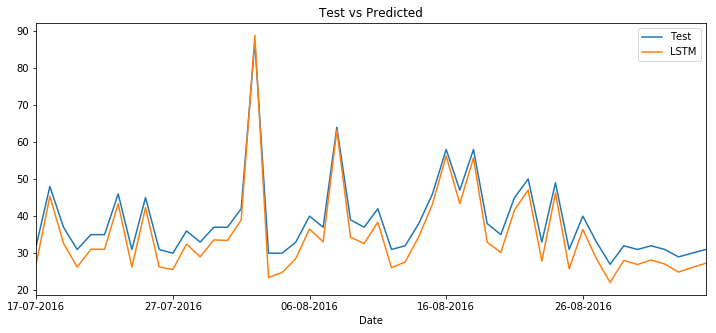

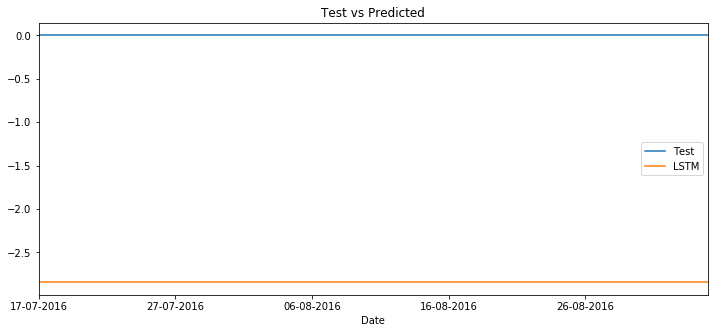

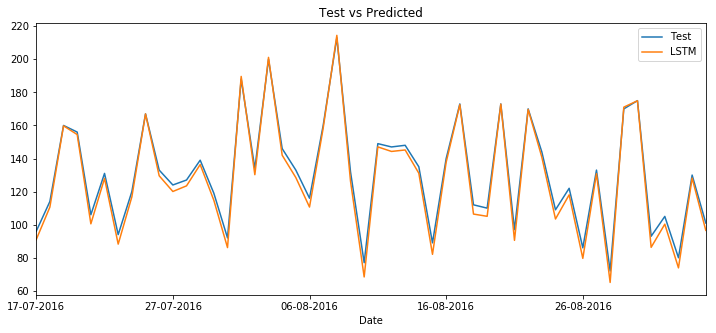

In [16]:
# transform data to be stationary
for country in countries:
    print(country)
    raw_values = series[country].values
    diff_values = np.diff(raw_values)

    # transform data to be supervised learning
    supervised = timeseries_to_supervised(diff_values, 1)
    supervised_values = supervised.values

    # split data into train and test-sets
    train, test = supervised_values[0:290], supervised_values[290:]

    # transform the scale of the data
    scaler, train_scaled, test_scaled = scale(train, test)

    lstm_model = fit_lstm(train_scaled, 1, 5, 4)
    train_reshaped = train_scaled[:, 0]
    train_reshaped = train_scaled[:, 0].reshape(len(train_scaled), 1, 1)

    lstm_model.predict(train_reshaped, batch_size=1)

    # walk-forward validation on the test data
    predictions = list()
    for i in range(len(test_scaled)):
        # make one-step forecast
        X, y = test_scaled[i, 0:-1], test_scaled[i, -1]
        yhat = forecast_lstm(lstm_model, 1, X)
        # invert scaling
        yhat = invert_scale(scaler, X, yhat)
        # invert differencing
        yhat = inverse_difference(raw_values, yhat, len(test_scaled)+1-i)
        # store forecast
        predictions.append(yhat)
        expected = raw_values[len(train) + i]
        #print('Date=%d, Predicted=%f, Expected=%f' % (i+1, yhat, expected))
    
    print('Mean Value : ',raw_values[291:].mean())
    print('MAE Value :', meanabs(raw_values[291:],predictions))
    print('RMSE Value :', np.sqrt(mean_squared_error(raw_values[291:],predictions)))
    
    df_new = pd.DataFrame({'Test':series[country].iloc[290:-1], 'LSTM':predictions})
    plt.figure();
    plt.title(label='Test vs Predicted')
    df_new['Test'].plot(figsize=(12,5), legend=True);
    df_new['LSTM'].plot(legend=True);

# Sliding Window RMSE

                               LSTM      SARIMAX        ARIMA
30 Step Slicing Window                                       
100                     1376.035058   314.019732   313.198374
130                     1391.366251   242.191013   255.246678
160                     1558.452416   598.504120   606.260028
190                     1477.646692   625.188516   645.024615
220                     2047.683697  1105.540458  1157.156573
250                     1949.543164  1162.834544  1354.334269
280                     1158.849191   860.859881  1287.460861
310                      422.322794  1174.267105  1401.572983
                               LSTM      SARIMAX        ARIMA
30 Step Slicing Window                                       
100                     2199.049888  1777.508638  2308.122949
130                     2397.923652  1752.663163  2340.297200
160                      915.473438  1101.982895   916.951801
190                      104.127737   422.081284   127.530503
220     

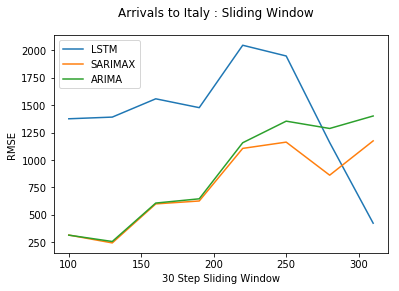

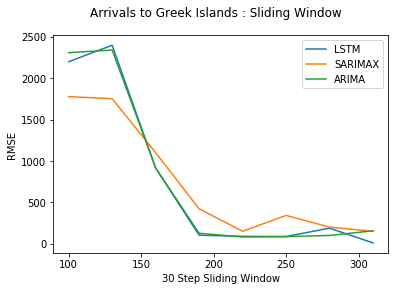

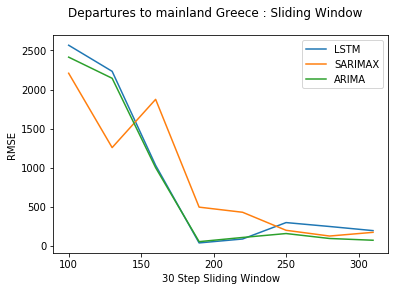

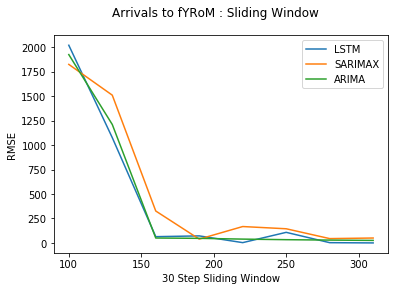

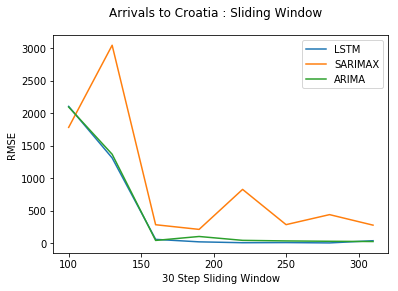

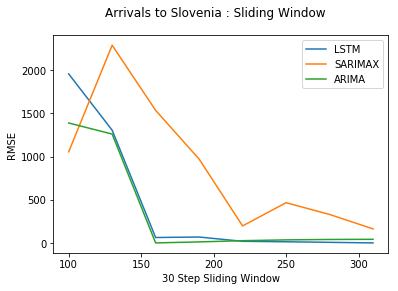

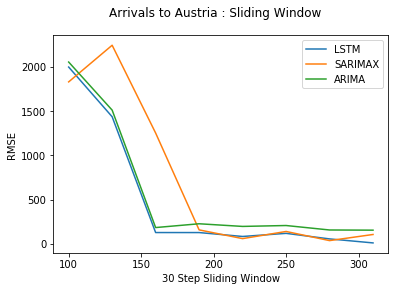

In [19]:
interval = [100,130,160,190,220,250,280,310]
iterations = 0
i_title = 0
while (iterations<len(sarimax_performance)-1):
    LSTM_perf = LSTM_performance[iterations:iterations+8]
    sarimax_perf = sarimax_performance[iterations:iterations+8]
    arima_perf = arima_performance[iterations:iterations+8]
    df = pd.DataFrame({'LSTM':LSTM_perf, 'SARIMAX':sarimax_perf, 'ARIMA':arima_perf, '30 Step Slicing Window':interval})
    df = df.set_index('30 Step Slicing Window')
    fig = plt.figure();
    plt.plot(df);
    fig.suptitle(f'{countries_sliding[i_title]} : Sliding Window')
    plt.ylabel(ylabel = 'RMSE')
    plt.xlabel(xlabel = '30 Step Sliding Window')    
    plt.gca().legend(('LSTM','SARIMAX','ARIMA'))
    i_title+=1
    iterations = iterations+8
    print(df)